# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import RandomOverSampler
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from collections import Counter

# Check TensorFlow version
print(f"Using TensorFlow Keras Version: {tf.keras.__version__}")

Using TensorFlow Keras Version: 2.10.0


# Dataset

Single,Sam, Iranmanesh,Saeid, and Raad,Raad. (2023). RealWaste. UCI Machine Learning Repository. https://doi.org/10.24432/C5SS4G.

### Prepare Data

The dataset is composed of the following labels and image counts:
  - Cardboard: 461
  - Food Organics: 411
  - Glass: 420
  - Metal: 790
  - Miscellaneous Trash: 495
  - Paper: 500
  - Plastic: 921
  - Vegetation: 436

All samples are:

    524px wide
    524px high

In [2]:
# Class Names
class_names = {
    0: 'Cardboard',
    1: 'Food Organic',
    2: 'Glass',
    3: 'Metal',
    4: 'Misc.',
    5: 'Paper',
    6: 'Plastic',
    7: 'Vegetation',
}

#### Load & Preprocess Dataset

In [3]:
# Load dataset from csv
df = pd.read_csv('/Users/djcum/OneDrive/Documents/ML Datasets/realwaste-main/RealWaste/Prepared_trash_data(2).csv')
#df.head()

# Return images as an array of RGB
def load_image(filepath):
    
    """
    Loads an image from a given file path and returns it as a NumPy array (RGB).

    Args:
        filepath (str): The file path to the image.

    Returns:
        numpy.ndarray: The loaded image array (RGB).
    """
    
    img = Image.open(filepath)
    return np.array(img)

df['image'] = df['Picture'].apply(load_image)

# Drop the 'Picture' column
df = df.drop(columns=['Picture'])

# Move the 'Class' column to the end & rename
class_column = df.pop('Class')
df['class'] = class_column

# Verify the changes
print(df.head())

                                               image      class
0  [[[140, 145, 148], [139, 144, 147], [142, 147,...  Cardboard
1  [[[146, 148, 160], [147, 149, 161], [146, 150,...  Cardboard
2  [[[142, 150, 153], [143, 151, 154], [145, 153,...  Cardboard
3  [[[141, 146, 150], [141, 146, 150], [140, 145,...  Cardboard
4  [[[143, 148, 152], [143, 148, 152], [140, 145,...  Cardboard


#### Normalize Data
- Take input image and covnert it to unit8 format to resize
- Resize images to 128x128 with PIL and convert it back to a NumPy array
- Normalize the values by dividing them by 255 to give a float between 0-1
- Using LabelEncoder give each class in the column a corresponding unique int

In [4]:
# Preprocessing function
def preprocess_image(image, target_size=(128, 128)):
        
    """
    Preprocesses the input image by ensuring it is in uint8 format, resizing it, and normalizing the pixel values.

    Args:
        image (numpy.ndarray): The input image to preprocess.
        target_size (tuple): The target size to resize the image to. Defaults to (128, 128).

    Returns:
        numpy.ndarray: The preprocessed image.
    """
    
    # Ensure the image array is in uint8 format
    if image.dtype != np.uint8:
        image = (image * 255).astype(np.uint8)
    
    # Resize image
    image = Image.fromarray(image).resize(target_size)
    image = np.array(image)

    # Normalize to values 0-1
    image = image / 255.0
    
    return image

# Normalize images
df['image'] = df['image'].apply(preprocess_image)

# Normalize Class column to int values
le = LabelEncoder()
df['class'] = le.fit_transform(df['class'])

print(df.head())

                                               image  class
0  [[[0.5607843137254902, 0.5803921568627451, 0.5...      0
1  [[[0.5411764705882353, 0.5568627450980392, 0.6...      0
2  [[[0.5529411764705883, 0.5843137254901961, 0.5...      0
3  [[[0.5490196078431373, 0.5686274509803921, 0.5...      0
4  [[[0.5529411764705883, 0.5725490196078431, 0.5...      0


#### Shuffle and Split Data
##### Shuffle the Data
df.sample(frac=1, random_state=42) shuffles the DataFrame rows. 

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sample.html

##### Split the data into train, validation, and test sets
- X = np.stack(df['image'].values): Converts the 'image' column into a NumPy array.
- y = df['class'].values: Extracts the 'class' column into a NumPy array y, which contains the class labels.

###### First Split:
- train_test_split(X, y, test_size=0.4, stratify=y, random_state=42): Splits X and y into training and temporary sets.
     - 60% of the data goes into the training set (X_train and y_train)
     - 40% goes into the temporary set (X_temp and y_temp).

###### Second Split:
- train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42): Spits temp set into two equally sized sets of validation and test.
  
###### New Datasets:

- Training set: X_train, y_train
- Validation set: X_valid, y_valid
- Test set: X_test, y_test

In [5]:
# Shuffle the Data
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

# Split the data into train, validation, and test sets
X = np.stack(df['image'].values)
y = df['class'].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, stratify=y, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# Verify the shapes of the splits
print(f"Train Shape: {X_train.shape}, {y_train.shape}")
print(f"Validation Shape: {X_valid.shape}, {y_valid.shape}")
print(f"Test Shape: {X_test.shape}, {y_test.shape}")

Train Shape: (2660, 128, 128, 3), (2660,)
Validation Shape: (887, 128, 128, 3), (887,)
Test Shape: (887, 128, 128, 3), (887,)


#### Scale Data Samples

###### Oversampling:
- Check for Oversampling:
if oversample:: This block executes only if oversample is set to True.
- Flatten Images for Oversampling:
X = X.reshape((X.shape[0], -1)): Reshapes X to flattened image
- Oversample the Dataset:
    - ros = RandomOverSampler(): Initializes RandomOverSampler
    - X, y = ros.fit_resample(X, y): Applies oversampling to balance the classes in X and y.
- Reshape Back to Original Dimensions:
X = X.reshape((X.shape[0], 128, 128, 3)): Reshapes X back a 4D array

In [6]:
def scale_dataset(X, y, oversample=False):
    
    """
    Scales the dataset and optionally performs oversampling to balance the classes.

    Args:
        X (numpy.ndarray): The input features.
        y (numpy.ndarray): The target labels.
        oversample (bool): Whether to perform oversampling. Defaults to False.

    Returns:
        tuple: Scaled features and labels.
    """
    
    if oversample:
        print(f"Original shape: {X.shape}")  # Debug print
        print(f"Class distribution before oversampling: \n{Counter(y)}")
        
        X = X.reshape((X.shape[0], -1))  # Flatten images for oversampling
        print(f"Flattened shape: {X.shape}")  # Debug print
        
        ros = RandomOverSampler()
        X, y = ros.fit_resample(X, y)
        print(f"After oversampling shape: {X.shape}")  # Debug print

        print(f"Class distribution after oversampling: \n{Counter(y)}")
        
        X = X.reshape((X.shape[0], 128, 128, 3))  # Reshape back to original dimensions

    return X, y

In [7]:
X_train, y_train = scale_dataset(X_train, y_train, oversample=True)
X_valid, y_valid = scale_dataset(X_valid, y_valid, oversample=False)
X_test, y_test = scale_dataset(X_test, y_test, oversample=False)

Original shape: (2660, 128, 128, 3)
Class distribution before oversampling: 
Counter({6: 552, 3: 474, 5: 300, 4: 297, 0: 276, 7: 262, 2: 252, 1: 247})
Flattened shape: (2660, 49152)
After oversampling shape: (4416, 49152)
Class distribution after oversampling: 
Counter({2: 552, 1: 552, 6: 552, 3: 552, 4: 552, 5: 552, 0: 552, 7: 552})


#### Verify Sampling

In [8]:
print(X_train[0][0][0])
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')

[0.75686275 0.80784314 0.87058824]
X_train shape: (4416, 128, 128, 3)
y_train shape: (4416,)


In [9]:
# Convert back to df to checking class distribution
train_df = pd.DataFrame({'image': list(X_train), 'class': y_train})
valid_df = pd.DataFrame({'image': list(X_valid), 'class': y_valid})
test_df = pd.DataFrame({'image': list(X_test), 'class': y_test})

# Check class distribution in the original DataFrame
print("Original DataFrame class distribution:")
print(df['class'].value_counts().sort_index())

# Check class distribution in the training set
print("\nTraining set class distribution:")
print(train_df['class'].value_counts().sort_index())
print("\nValidation set class distribution:")
print(valid_df['class'].value_counts().sort_index())
print("\nTesting set class distribution:")
print(test_df['class'].value_counts().sort_index())

Original DataFrame class distribution:
class
0    461
1    411
2    420
3    790
4    495
5    500
6    921
7    436
Name: count, dtype: int64

Training set class distribution:
class
0    552
1    552
2    552
3    552
4    552
5    552
6    552
7    552
Name: count, dtype: int64

Validation set class distribution:
class
0     92
1     82
2     84
3    158
4     99
5    100
6    185
7     87
Name: count, dtype: int64

Testing set class distribution:
class
0     93
1     82
2     84
3    158
4     99
5    100
6    184
7     87
Name: count, dtype: int64


#### Visualize Data

In [10]:
# Extract images and labels
X = np.stack(df['image'].values)
y = df['class'].values

print(X.shape, y.shape)

(4434, 128, 128, 3) (4434,)


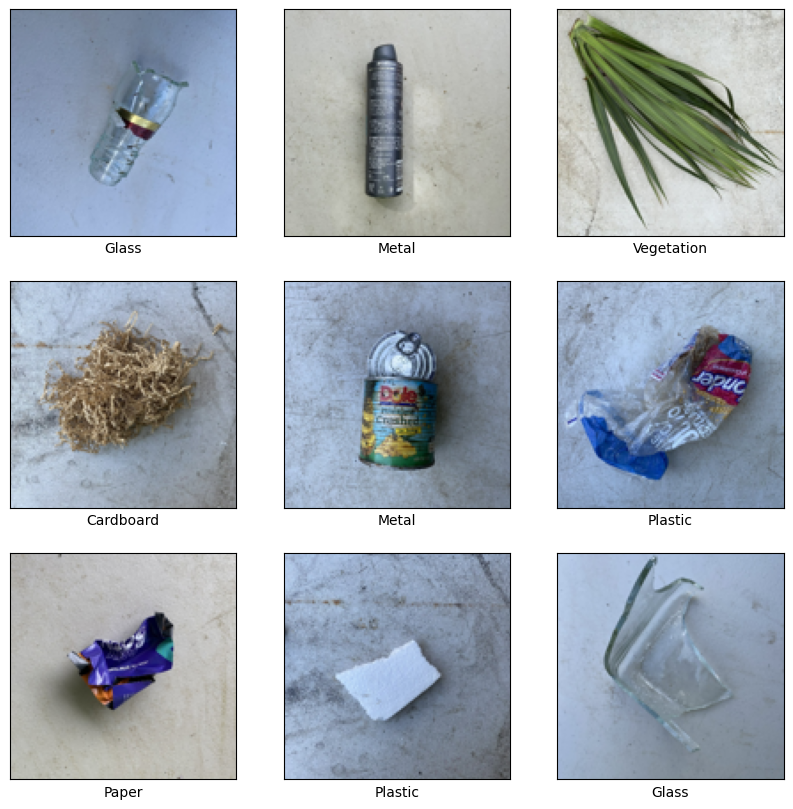

In [11]:
# select a random set of 9 images
idx = np.random.randint(len(X) - 9)

plt.figure(figsize=(10,10))
for i in range(9):
    # plot each sample
    plt.subplot(3, 3, i+1)   
    plt.imshow(X[i + idx]) 
    label_idx = y[i + idx]  # Get the label index
    plt.xlabel(class_names[label_idx])
    plt.xticks([])
    plt.yticks([])

# display results
plt.show()

# Neural Network

In [12]:
#print(X_valid)
#print(y_valid)

### Layers

###### Input Shape:
- tf.keras.Input(shape=(128, 128, 3)): Resizes inputs to 128x128

###### Conv2D Layers:
- Increased the depth progressively from 32 to 256 filters. This layer ensures the model can detect patterns and features in images by applying filters that scan across the input image. Conv2D is a well known tool for image classification. 

    https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D

###### MaxPooling2D Layers:
- Pool size of (2, 2) after each Conv2D layer to reduce computational load by downsampling by taking the maximum value of smaller regions.

    https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D

###### Dropout Layers:
- Dropout probability of 0.5 to prevent overfitting by randomly dropping units during training. Dropout randomly drops neurons which prevents the model from relying on specific neurons. 

    https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout

###### Dense Layers:
- Dense layers connect all neurons from a previous layer to all neurons in a current layer. Also known as the "Fully Connected Layer"
  
    https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense
  
    - Dense(256, activation='relu')
        - ReLU activation introduces non-linearity
          
          https://www.tensorflow.org/api_docs/python/tf/keras/activations/relu
    - Dense(8, activation='softmax')
        - Softmax activation converts raw outputs into probabilities that sum to 100%. Popular and useful for multiclass classification.
          
          https://www.tensorflow.org/api_docs/python/tf/keras/activations/softmax

###### Optimizer:
- tf.keras.optimizers.Adam(learning_rate): Updates the weights of a neural network by combining the benefits of AdaGrad and RMSProp. Results in a faster and more reliable training model. 

  https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam

###### Early Stopping:
- tf.keras.callbacks.EarlyStopping: Stops the training for the current cycle if validation loss is not improving.

  https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [13]:
# Define the Sequential model with data augmentation
def train_model(X_train, y_train, X_valid, y_valid, num_nodes, dropout_prob, learning_rate, batch_size, epochs):

    """
    Trains the CNN model with the given parameters and data.

    Args:
        X_train (numpy.ndarray): Training images.
        y_train (numpy.ndarray): Training labels.
        X_valid (numpy.ndarray): Validation images.
        y_valid (numpy.ndarray): Validation labels.
        num_nodes (int): Number of nodes in the fully connected layer.
        dropout_prob(float): Dropout probability for regularization.
        learning_rate (float): Learning rate for the optimizer.
        batch_size (int): Number of samples per batch.
        epochs (int): Number of epochs to train the model.

    Returns:
        nn_model: The trained Keras model.
        history: Training history object.
    """

    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    datagen.fit(X_train)
    
    nn_model = tf.keras.Sequential([
        tf.keras.Input(shape=(128, 128, 3)),
        
        # First Convolutional layer 
        layers.Conv2D(32, 3, activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2,2)),

        # Dropout to avoid overfitting
        layers.Dropout(dropout_prob),

        # Second Convolutional layer
        layers.Conv2D(64, 3, activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Third Convolutional layer
        layers.Conv2D(128, 3, activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Fourth Convolutional layer
        layers.Conv2D(256, 3, activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D(pool_size=(2, 2)),

        # Flatten to transition from convoluted layers to connected layers
        layers.Flatten(),

        # Fully connected layer with relu activation
        layers.Dense(256, activation='relu'),

        # Dropout to avoid overfitting, regularizes after dense layer
        layers.Dropout(dropout_prob),
        
        layers.Dense(8, activation='softmax')
    ])

    # Compile the model
    nn_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])
    
    # Early stopping
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, restore_best_weights=True)
    
    # Train the model with data augmentation
    history = nn_model.fit(
        datagen.flow(X_train, y_train, batch_size=batch_size),
        epochs=epochs,
        validation_data=(X_valid, y_valid),
        callbacks=[early_stopping],
        verbose=0
    )

    return nn_model, history

#### Plot Definitions

Template from: https://www.tensorflow.org/guide/basics

In [14]:
# Tensorflow plot definitions

def plot_history(history):

    """
    Plots the training and validation loss and accuracy.

    Args:
        history: Training history object.
    """
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(14,6))

    # Loss
    ax1.plot(history.history['loss'], label='Training Loss')
    ax1.plot(history.history['val_loss'], label='Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Cross Entropy Loss')
    ax1.set_title('Train & Val Loss')
    ax1.legend()
    ax1.grid(True)

    # Accuracy
    ax2.plot(history.history['accuracy'], label='Training Accuracy')
    ax2.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Train & Val Accuracy')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show() 

### Training the model

In [15]:
# Find best model
def find_best_model(X_train, y_train, X_valid, y_valid, X_test, y_test, epochs=100):

    """
    Finds the best model by training with various hyperparameters and evaluating on validation data.

    Args:
        X_train (numpy.ndarray): Training images.
        y_train (numpy.ndarray): Training labels.
        X_valid (numpy.ndarray): Validation images.
        y_valid (numpy.ndarray): Validation labels.
        X_test (numpy.ndarray): Testing images.
        y_test (numpy.ndarray): Testing labels.
        epochs (int): Number of epochs to train the model. Defaults to 100.

    Returns:
        best_model: The best trained model.
        best_history: Training history of the best model.
        best_test_loss: Test loss of the best model.
        best_test_accuracy: Test accuracy of the best model.
    """
    
    least_validation_loss = float('inf')
    least_loss_model = None
    best_history = None

    # Parameters
    num_nodes_list = [32, 64, 128]  
    dropout_prob_list = [0.2, 0.3, 0.4]  
    learning_rate_list = [0.0001, 0.001, 0.01]  
    batch_size_list = [16, 32, 128]  

    for num_nodes in num_nodes_list:
        for dropout_prob in dropout_prob_list:
            for learning_rate in learning_rate_list:
                for batch_size in batch_size_list:
                    print(f"\n\nNodes: {num_nodes}, Dropout: {dropout_prob}, Learning Rate: {learning_rate}, Batch Size: {batch_size}")
                    model, history = train_model(X_train, y_train, X_valid, y_valid, num_nodes, dropout_prob, learning_rate, batch_size, epochs)
                    plot_history(history)
                    
                    val_loss = model.evaluate(X_valid, y_valid)[0]
                  
                    if val_loss < least_validation_loss:
                        least_validation_loss = val_loss
                        least_loss_model = model
                        best_history = history
                

    # Evaluate the best model on the test data
    test_loss, test_accuracy = least_loss_model.evaluate(X_test, y_test, verbose=0)
    print(f'Best validation loss: {least_validation_loss:.4f}')
    print(f'Test accuracy: {test_accuracy:.4f}')
    return least_loss_model, best_history, test_loss, test_accuracy



Nodes: 32, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 16


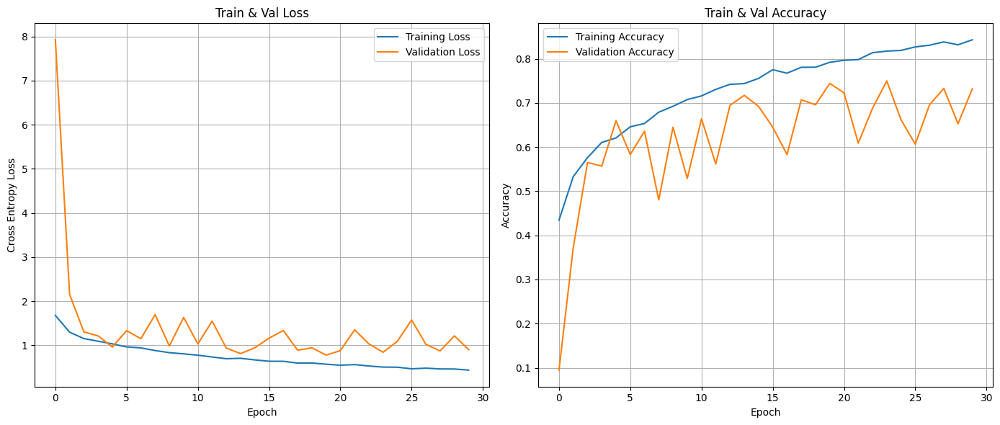

28/28 [==============================] - 0s 6ms/step - loss: 0.7764 - accuracy: 0.7441


Nodes: 32, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 32


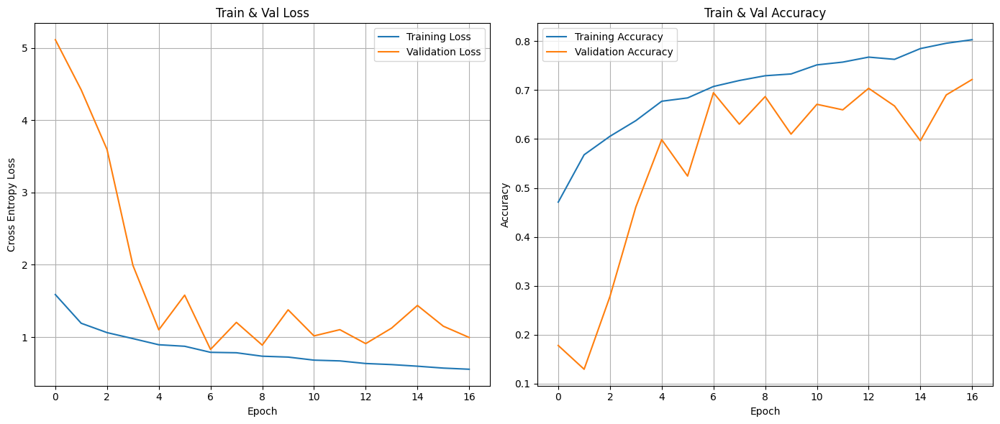

28/28 [==============================] - 0s 6ms/step - loss: 0.8297 - accuracy: 0.6945


Nodes: 32, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 128


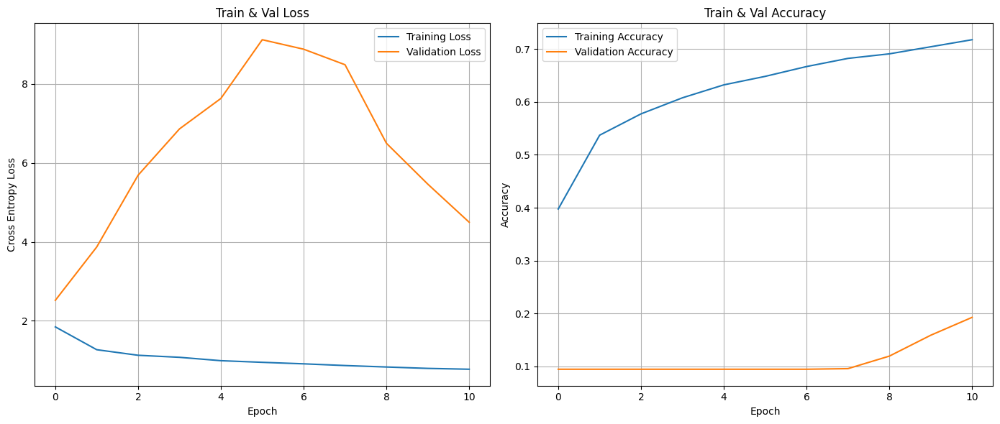

28/28 [==============================] - 0s 6ms/step - loss: 2.5204 - accuracy: 0.0947


Nodes: 32, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 16


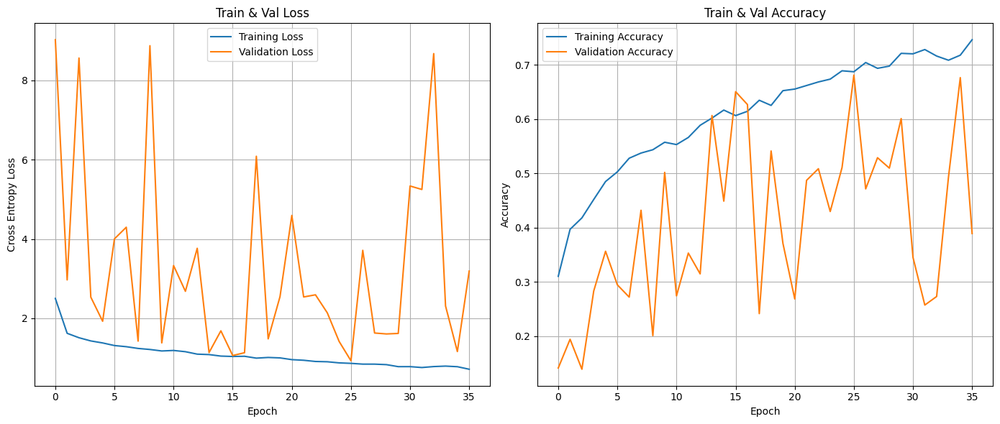

28/28 [==============================] - 0s 6ms/step - loss: 0.9297 - accuracy: 0.6809


Nodes: 32, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 32


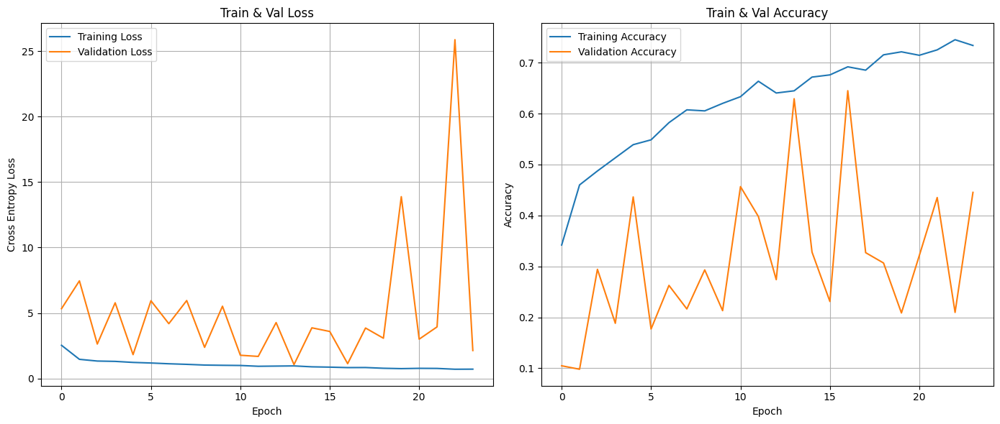

28/28 [==============================] - 0s 6ms/step - loss: 1.0626 - accuracy: 0.6291


Nodes: 32, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 128


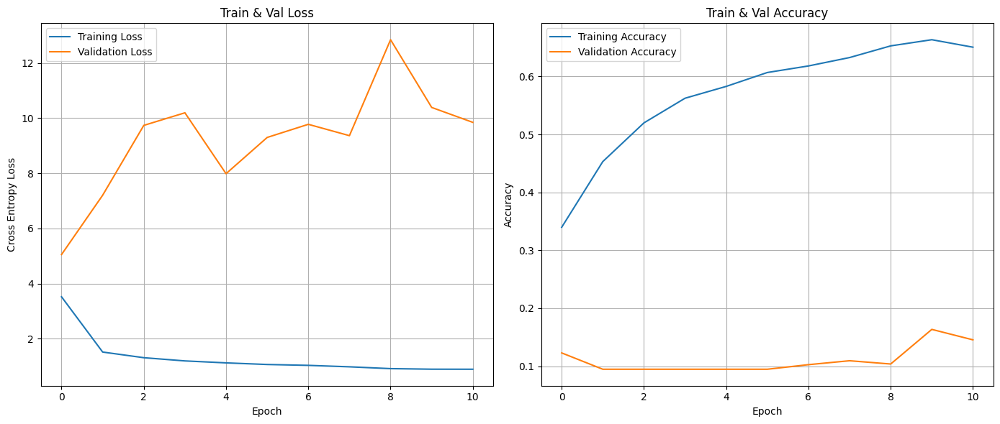

28/28 [==============================] - 0s 6ms/step - loss: 5.0544 - accuracy: 0.1229


Nodes: 32, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 16


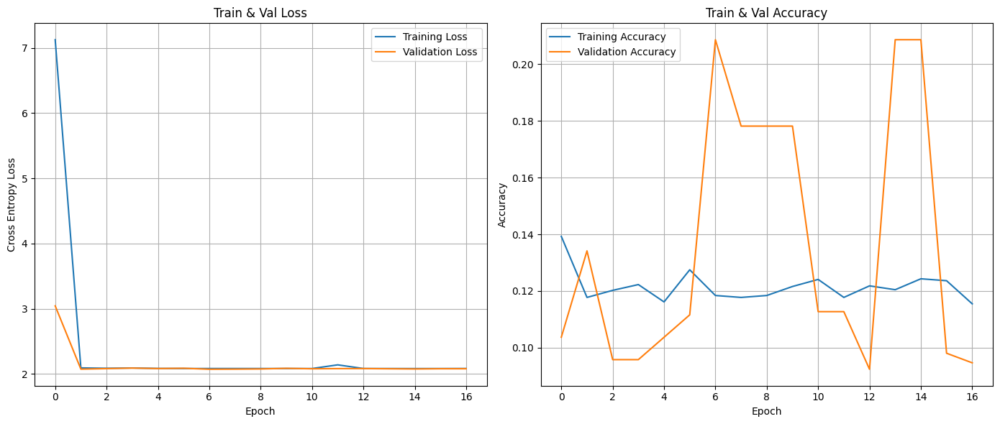

28/28 [==============================] - 0s 6ms/step - loss: 2.0705 - accuracy: 0.2086


Nodes: 32, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 32


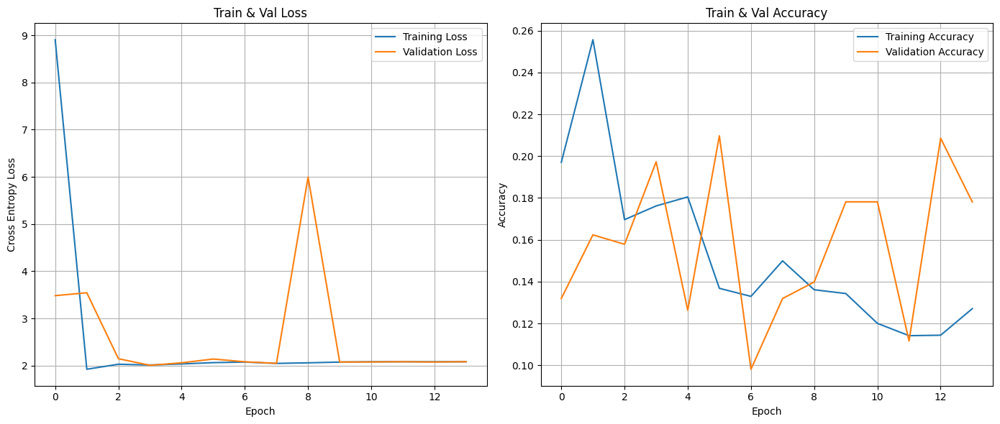

28/28 [==============================] - 0s 6ms/step - loss: 2.0053 - accuracy: 0.1973


Nodes: 32, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 128


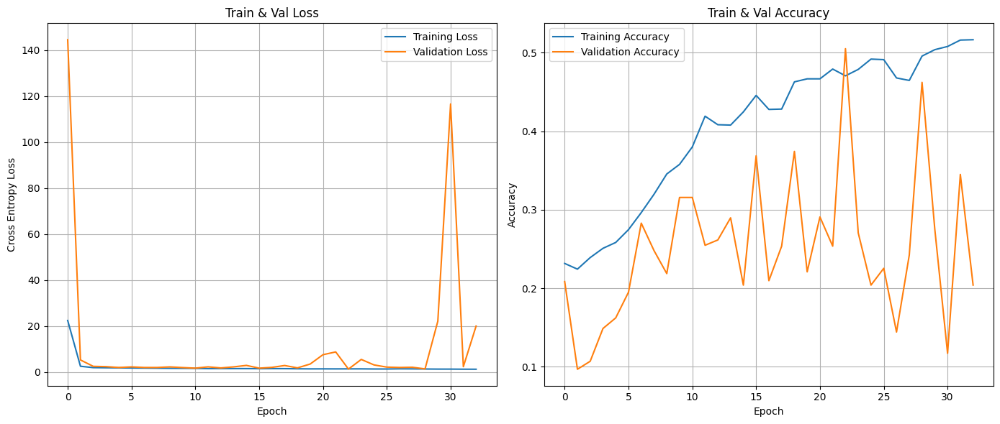

28/28 [==============================] - 0s 6ms/step - loss: 1.3603 - accuracy: 0.5051


Nodes: 32, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 16


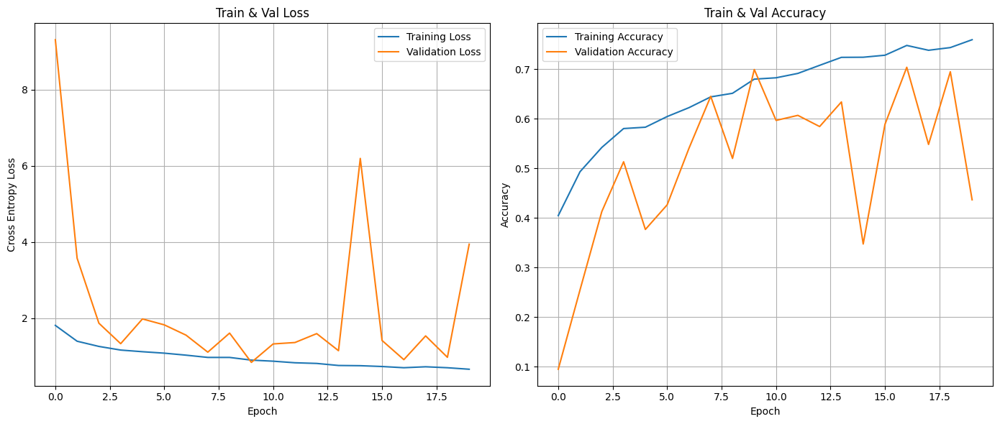

28/28 [==============================] - 0s 6ms/step - loss: 0.8360 - accuracy: 0.6990


Nodes: 32, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 32


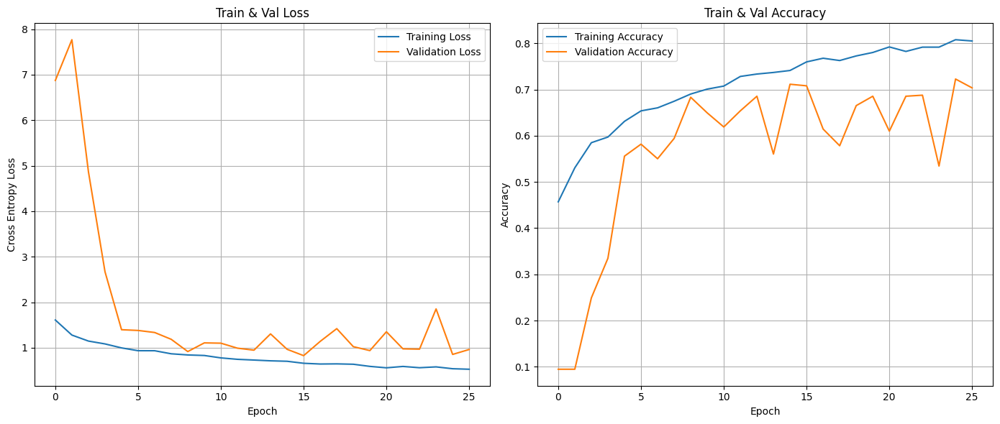

28/28 [==============================] - 0s 6ms/step - loss: 0.8268 - accuracy: 0.7080


Nodes: 32, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 128


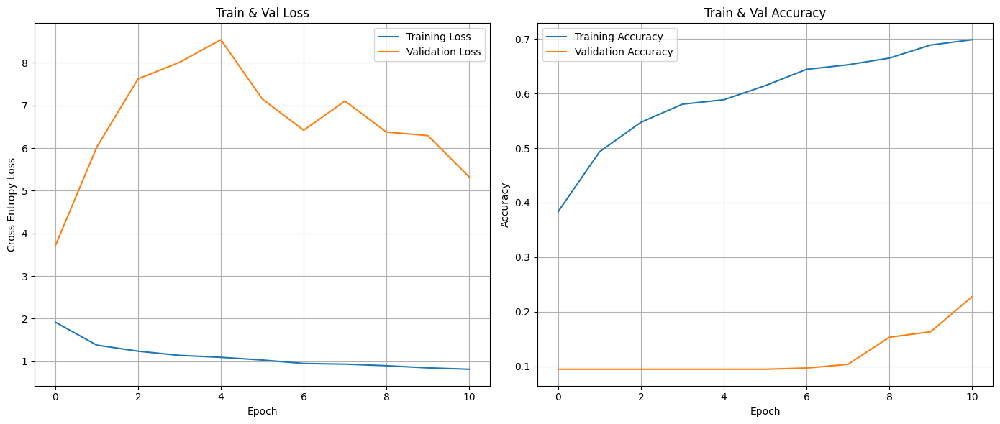

28/28 [==============================] - 0s 6ms/step - loss: 3.7082 - accuracy: 0.0947


Nodes: 32, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 16


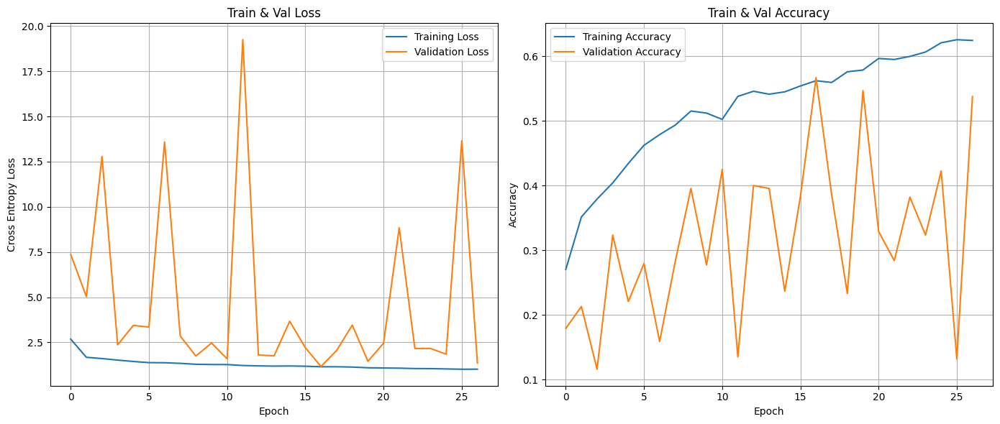

28/28 [==============================] - 0s 6ms/step - loss: 1.1696 - accuracy: 0.5671


Nodes: 32, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 32


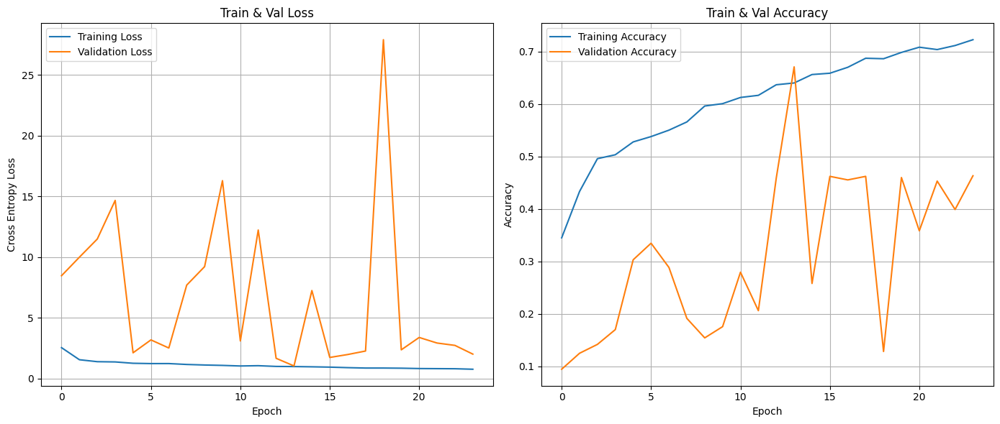

28/28 [==============================] - 0s 6ms/step - loss: 1.0263 - accuracy: 0.6708


Nodes: 32, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 128


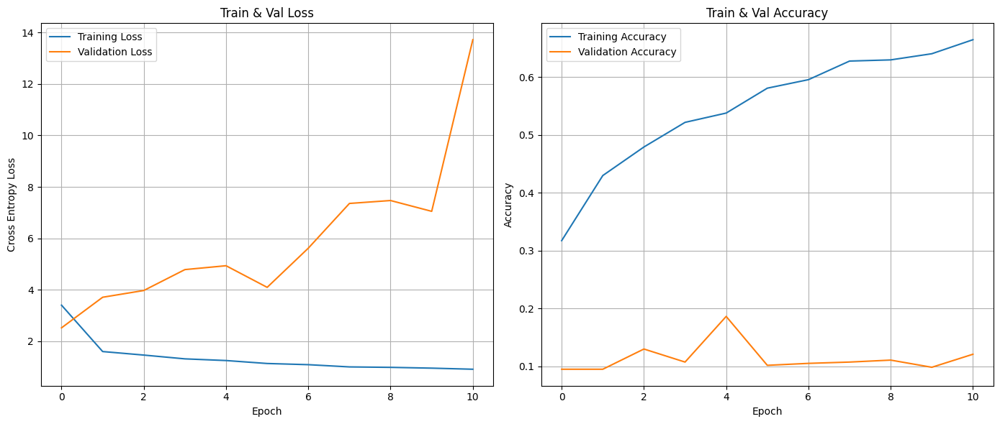

28/28 [==============================] - 0s 6ms/step - loss: 2.5217 - accuracy: 0.0947


Nodes: 32, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 16


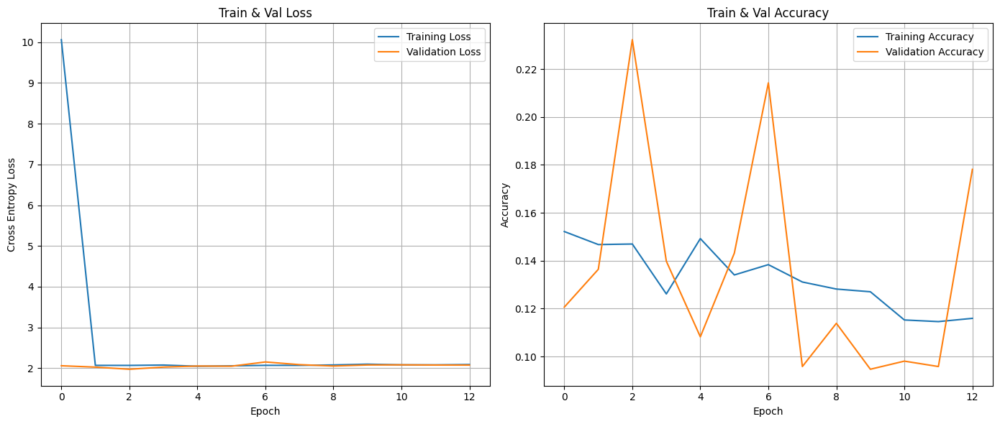

28/28 [==============================] - 0s 6ms/step - loss: 1.9741 - accuracy: 0.2322


Nodes: 32, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 32


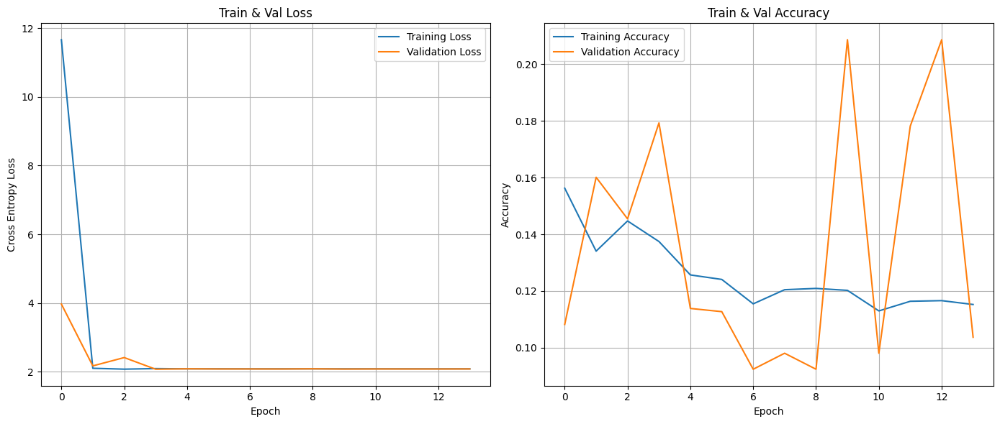

28/28 [==============================] - 0s 6ms/step - loss: 2.0703 - accuracy: 0.1793


Nodes: 32, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 128


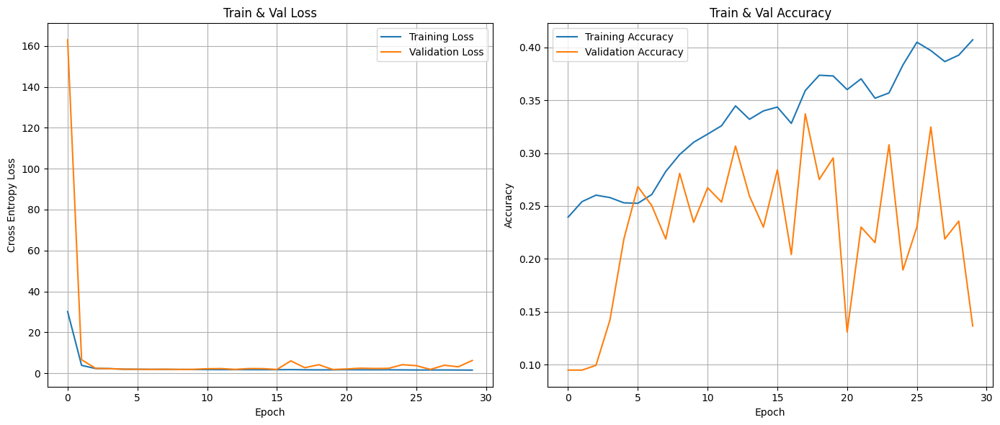

28/28 [==============================] - 0s 6ms/step - loss: 1.8103 - accuracy: 0.2954


Nodes: 32, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 16


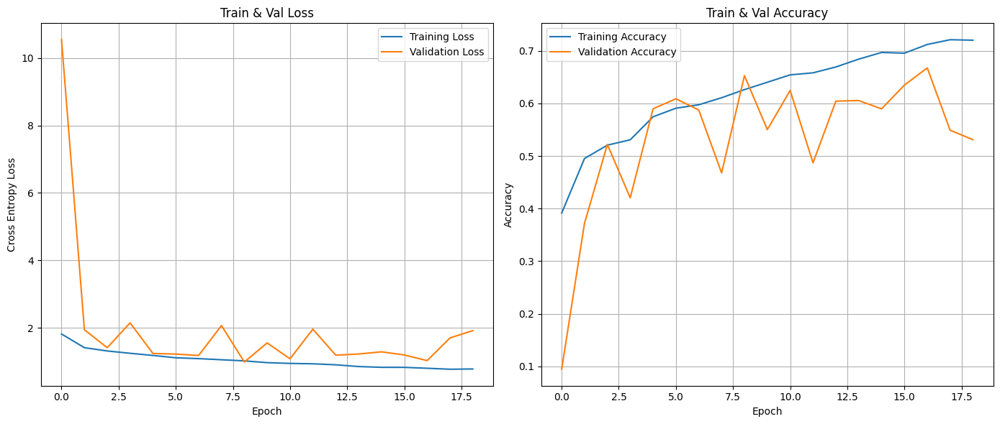

28/28 [==============================] - 0s 6ms/step - loss: 0.9866 - accuracy: 0.6528


Nodes: 32, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 32


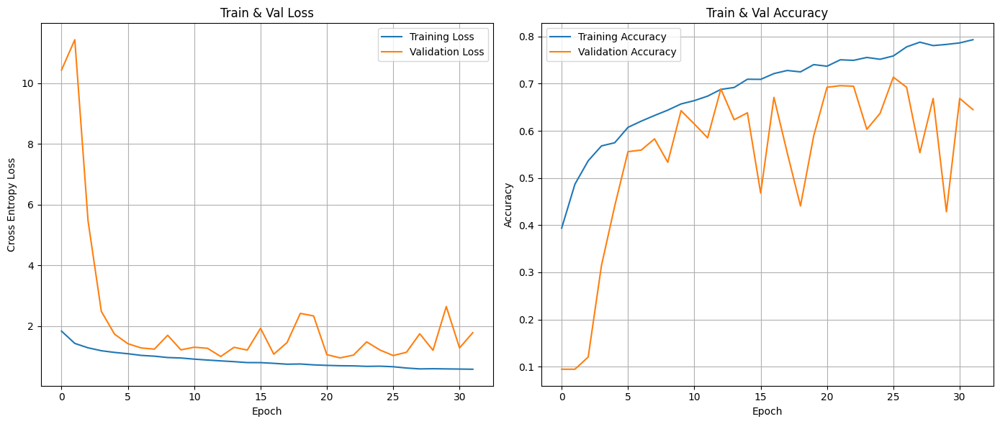

28/28 [==============================] - 0s 6ms/step - loss: 0.9463 - accuracy: 0.6956


Nodes: 32, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 128


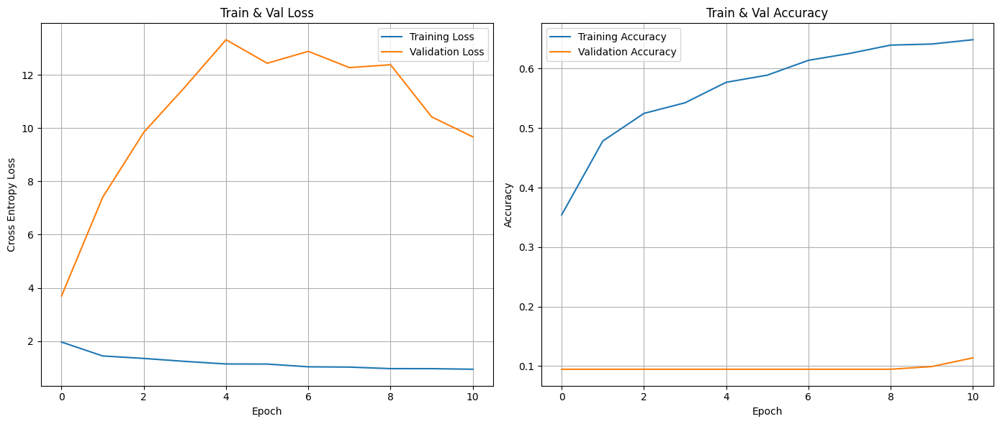

28/28 [==============================] - 0s 6ms/step - loss: 3.6960 - accuracy: 0.0947


Nodes: 32, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 16


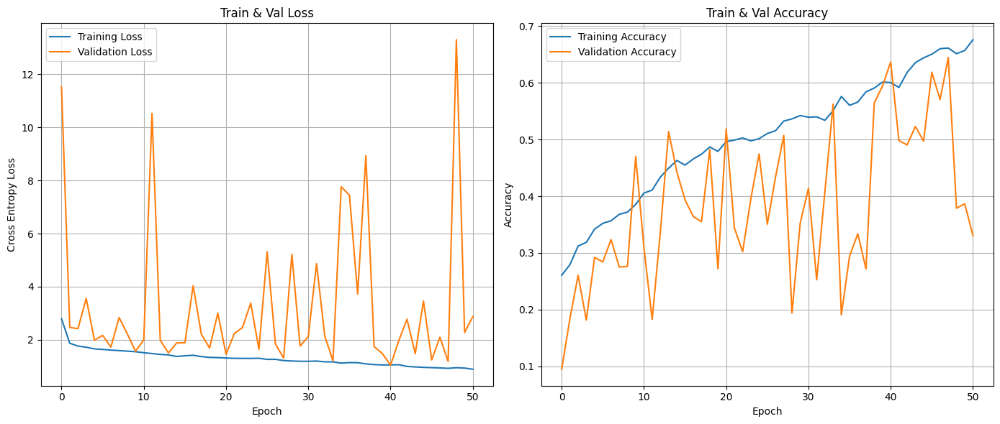

28/28 [==============================] - 0s 6ms/step - loss: 1.0452 - accuracy: 0.6370


Nodes: 32, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 32


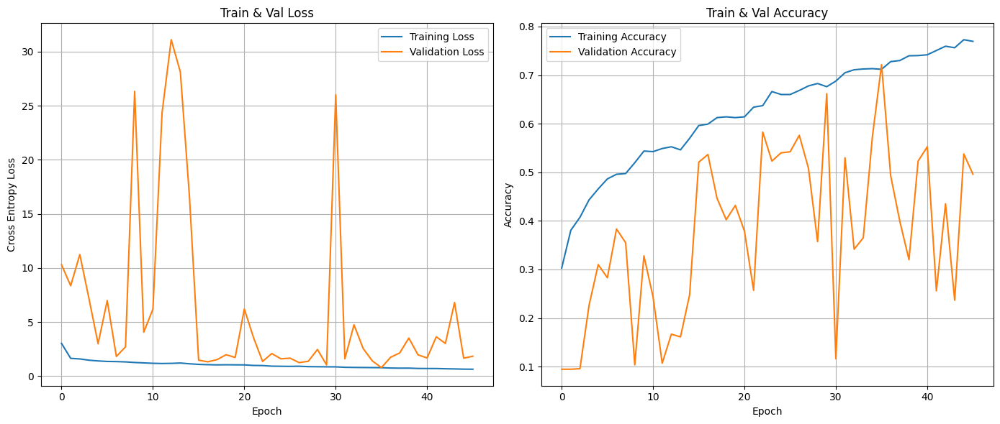

28/28 [==============================] - 0s 6ms/step - loss: 0.7891 - accuracy: 0.7215


Nodes: 32, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 128


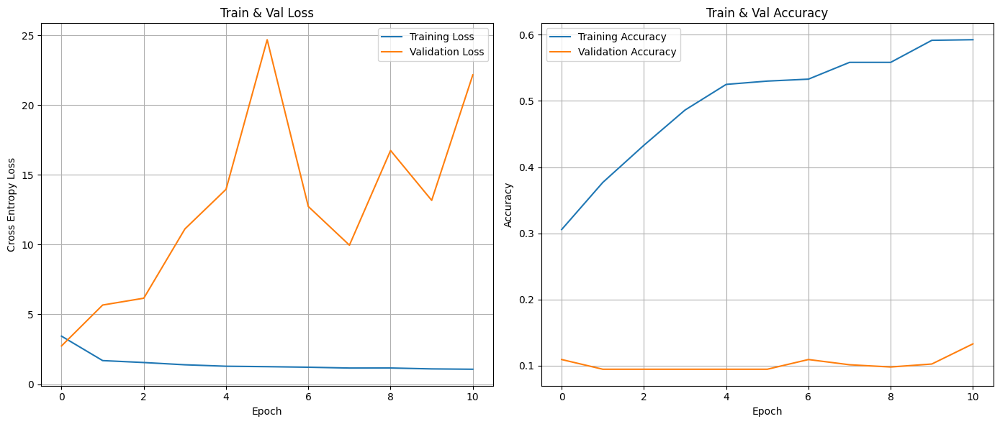

28/28 [==============================] - 0s 6ms/step - loss: 2.7399 - accuracy: 0.1094


Nodes: 32, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 16


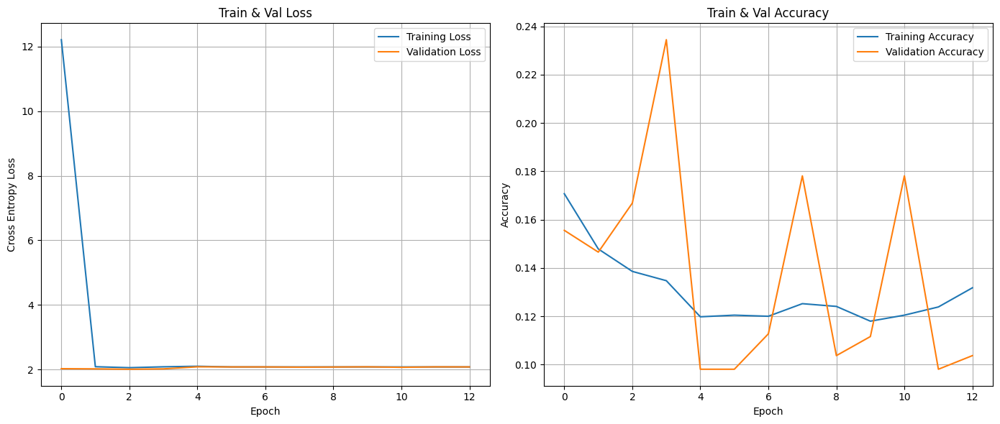

28/28 [==============================] - 0s 6ms/step - loss: 2.0106 - accuracy: 0.1669


Nodes: 32, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 32


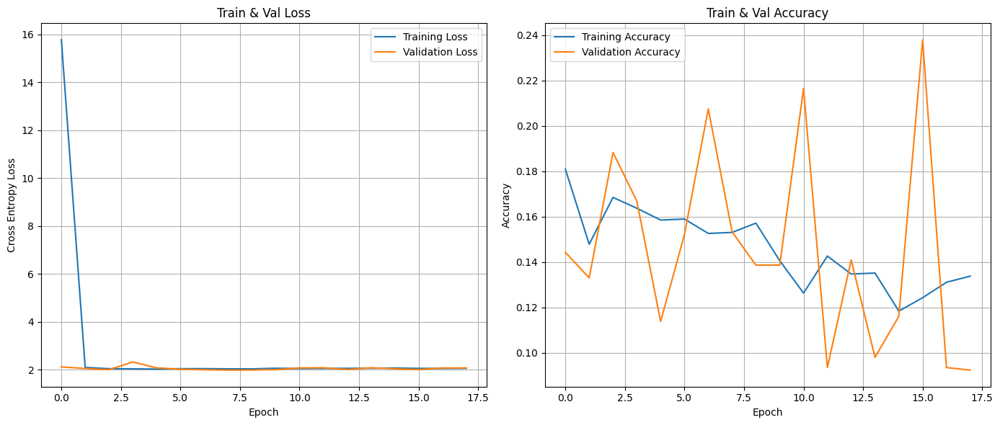

28/28 [==============================] - 0s 6ms/step - loss: 1.9885 - accuracy: 0.1533


Nodes: 32, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 128


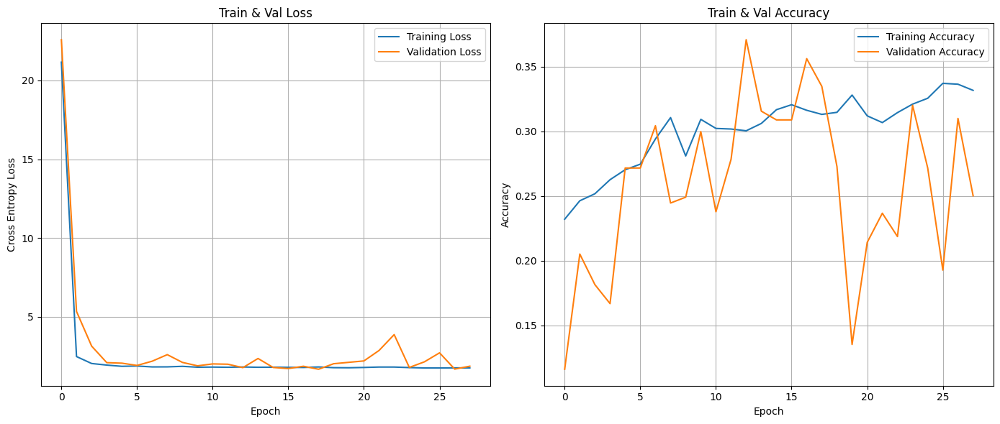

28/28 [==============================] - 0s 6ms/step - loss: 1.6596 - accuracy: 0.3348


Nodes: 64, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 16


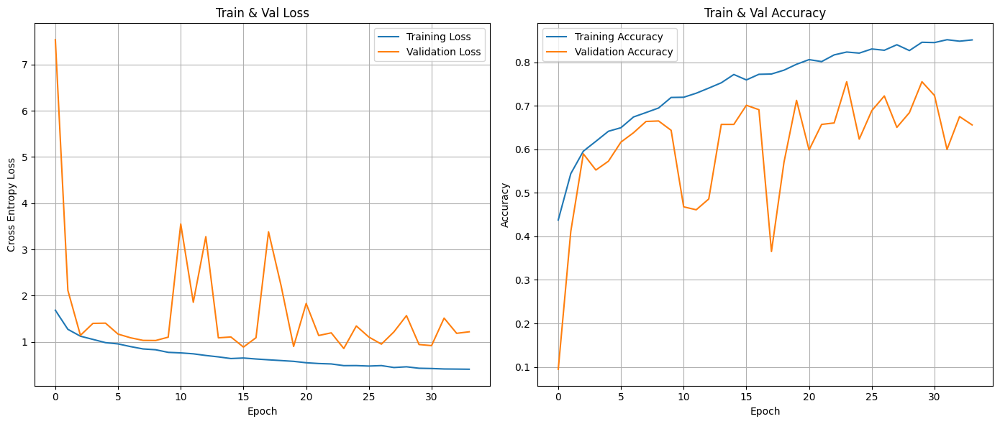

28/28 [==============================] - 0s 6ms/step - loss: 0.8563 - accuracy: 0.7554


Nodes: 64, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 32


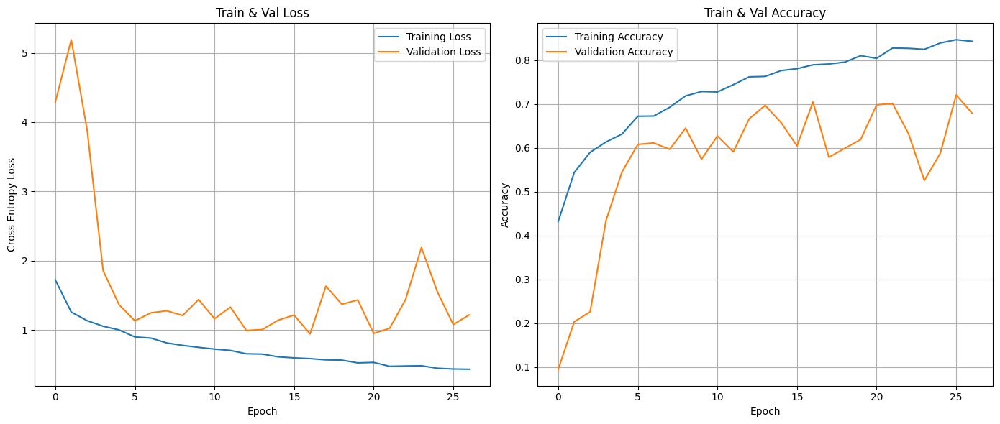

28/28 [==============================] - 0s 6ms/step - loss: 0.9421 - accuracy: 0.7046


Nodes: 64, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 128


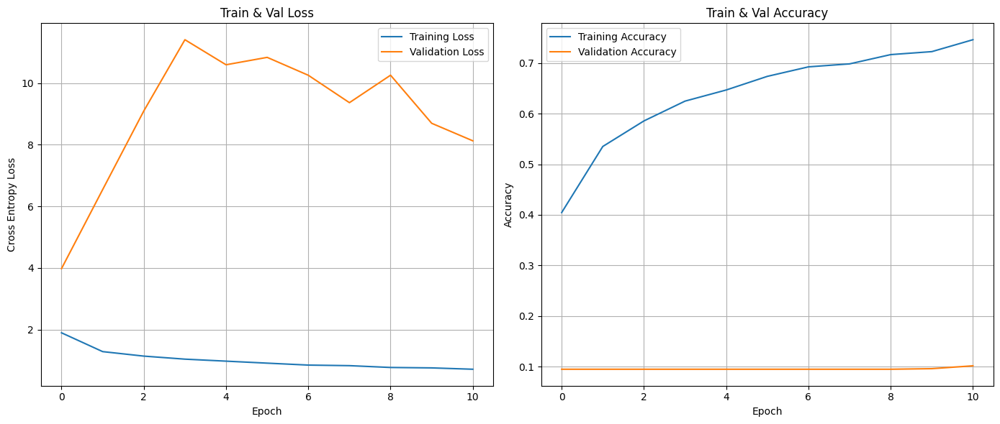

28/28 [==============================] - 0s 6ms/step - loss: 3.9774 - accuracy: 0.0947


Nodes: 64, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 16


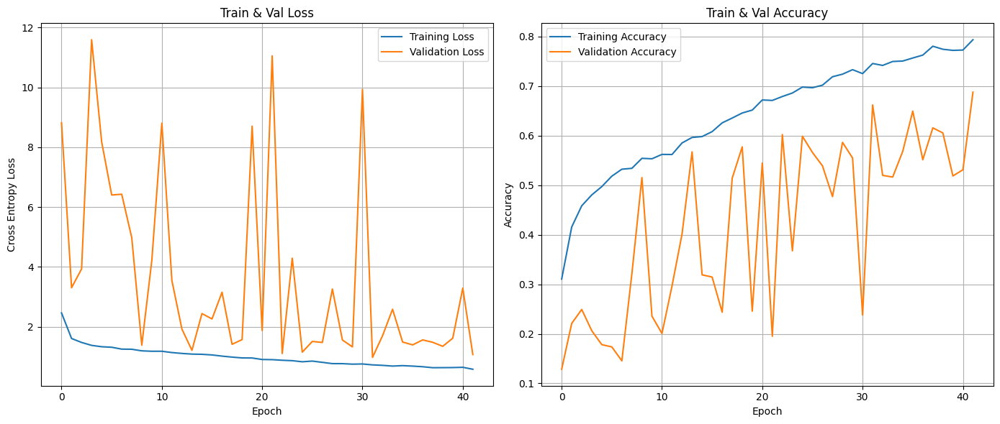

28/28 [==============================] - 0s 6ms/step - loss: 0.9718 - accuracy: 0.6618


Nodes: 64, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 32


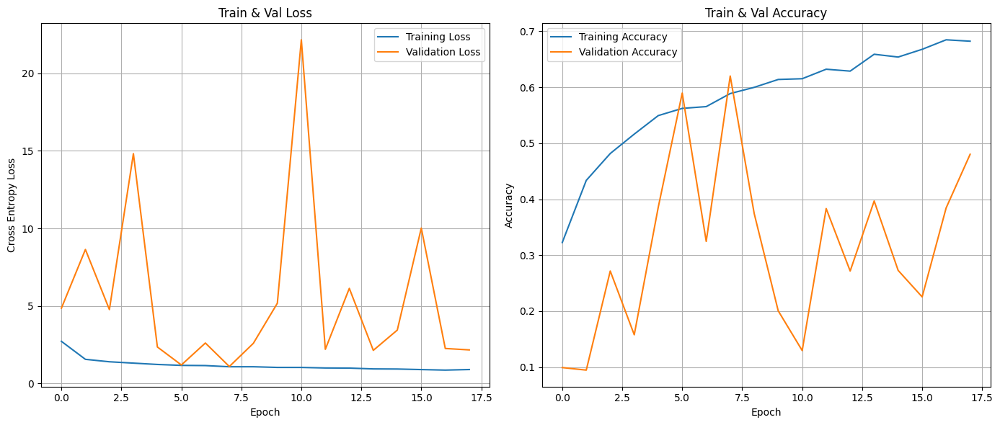

28/28 [==============================] - 0s 6ms/step - loss: 1.0856 - accuracy: 0.6201


Nodes: 64, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 128


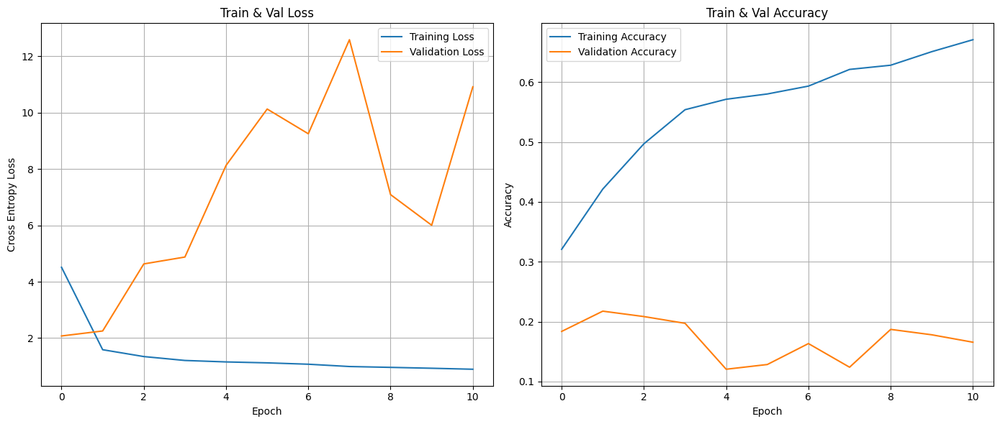

28/28 [==============================] - 0s 6ms/step - loss: 2.0764 - accuracy: 0.1838


Nodes: 64, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 16


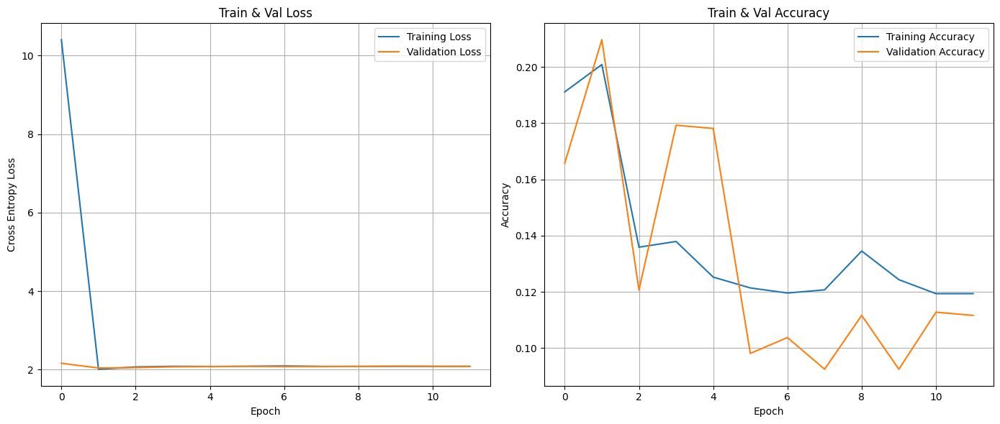

28/28 [==============================] - 0s 6ms/step - loss: 2.0408 - accuracy: 0.2097


Nodes: 64, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 32


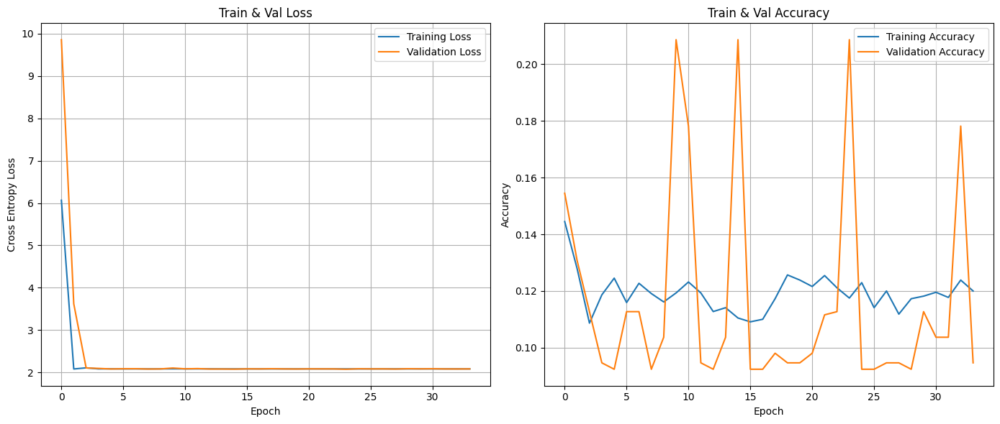

28/28 [==============================] - 0s 6ms/step - loss: 2.0729 - accuracy: 0.2086


Nodes: 64, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 128


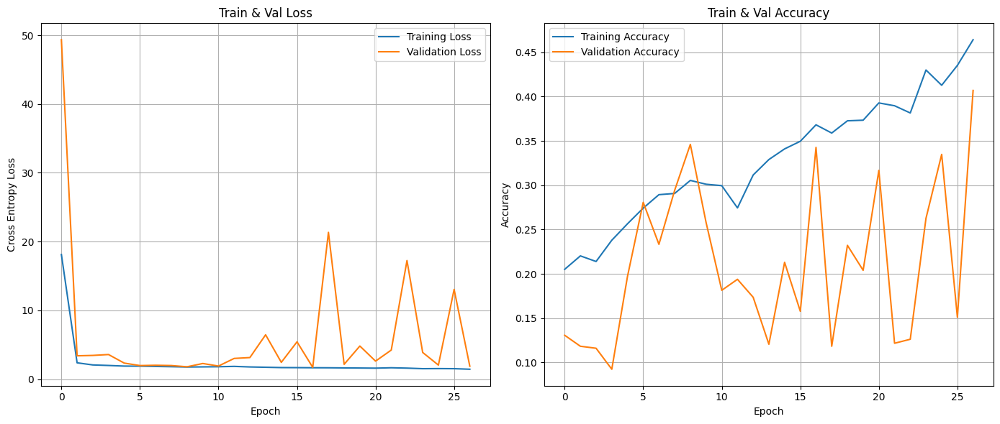

28/28 [==============================] - 0s 6ms/step - loss: 1.7126 - accuracy: 0.3427


Nodes: 64, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 16


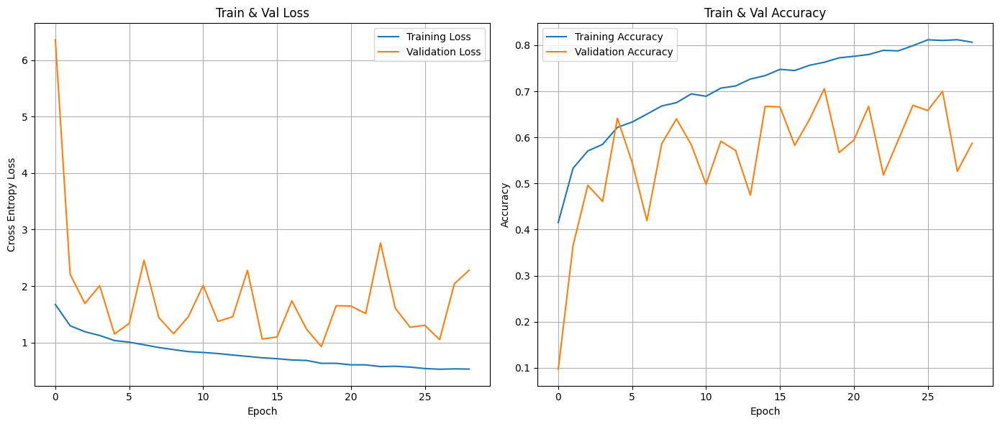

28/28 [==============================] - 0s 6ms/step - loss: 0.9275 - accuracy: 0.7057


Nodes: 64, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 32


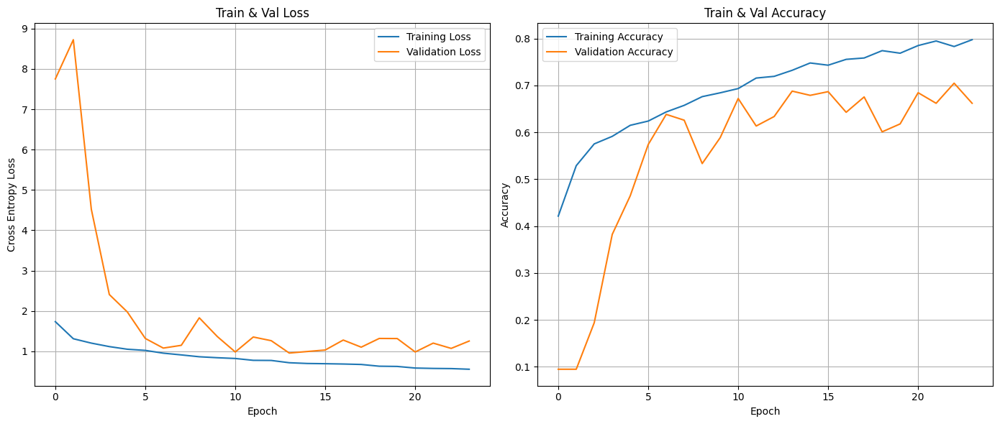

28/28 [==============================] - 0s 6ms/step - loss: 0.9565 - accuracy: 0.6877


Nodes: 64, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 128


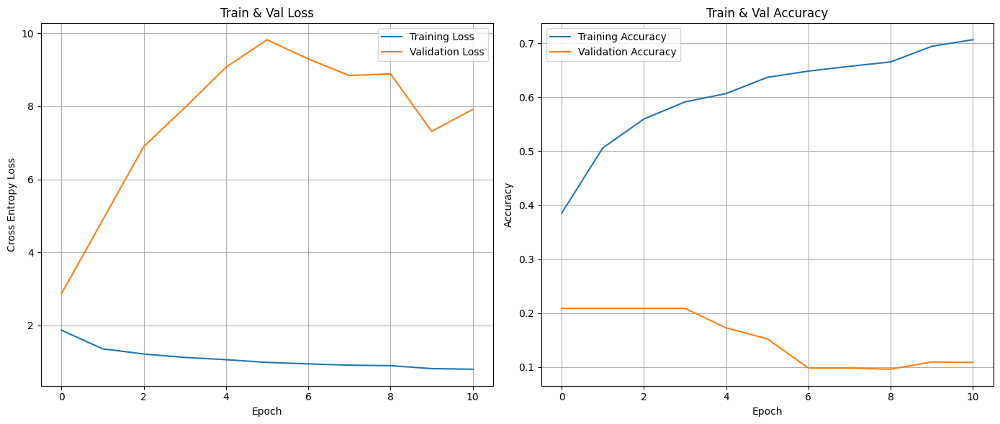

28/28 [==============================] - 0s 6ms/step - loss: 2.8730 - accuracy: 0.2086


Nodes: 64, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 16


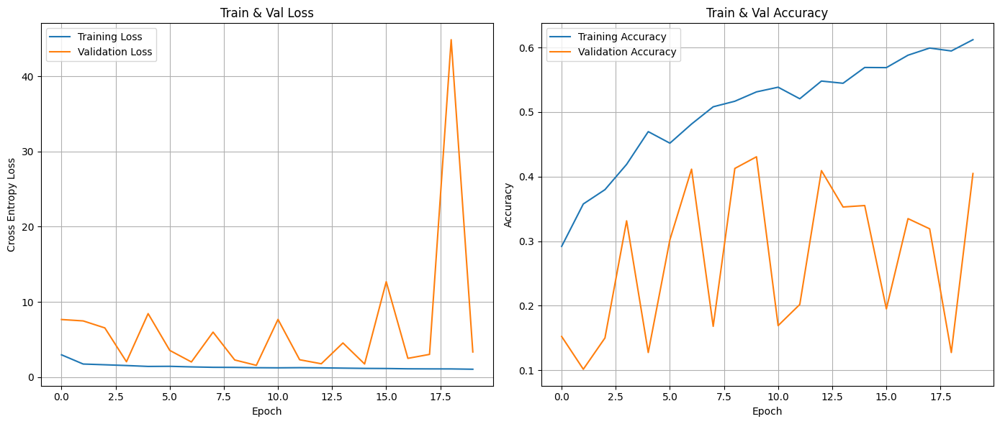

28/28 [==============================] - 0s 6ms/step - loss: 1.5659 - accuracy: 0.4307


Nodes: 64, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 32


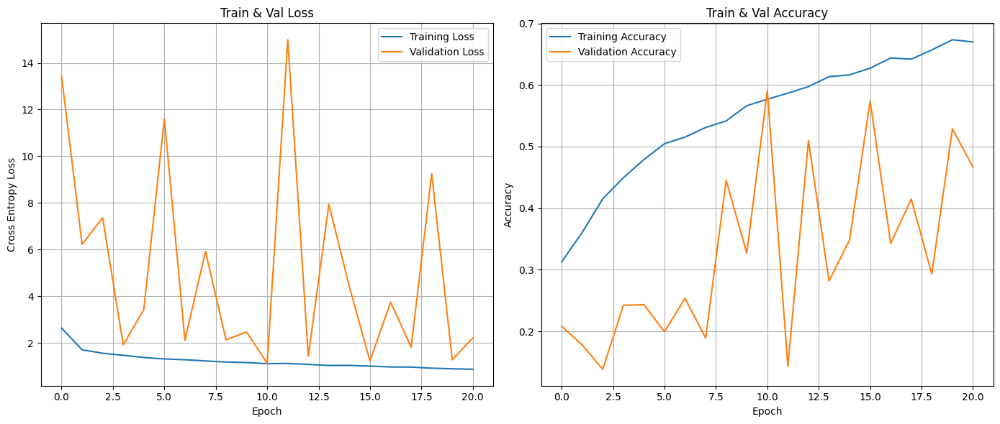

28/28 [==============================] - 0s 6ms/step - loss: 1.1223 - accuracy: 0.5908


Nodes: 64, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 128


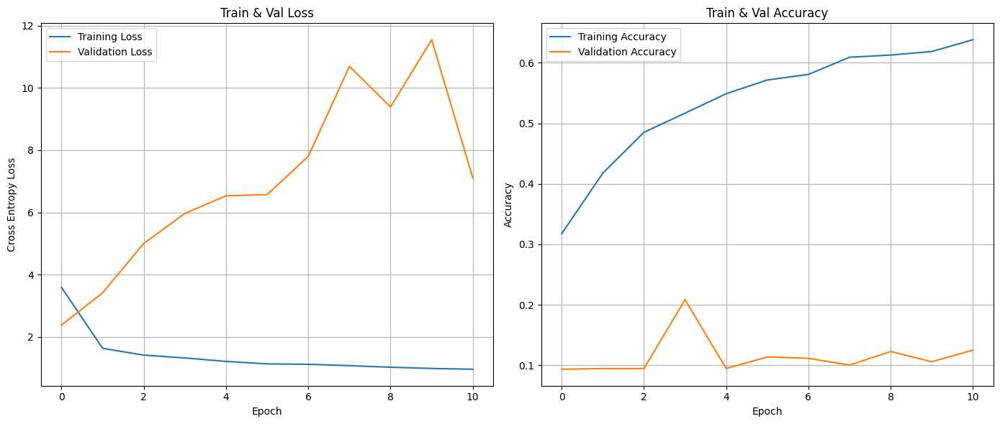

28/28 [==============================] - 0s 6ms/step - loss: 2.3811 - accuracy: 0.0936


Nodes: 64, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 16


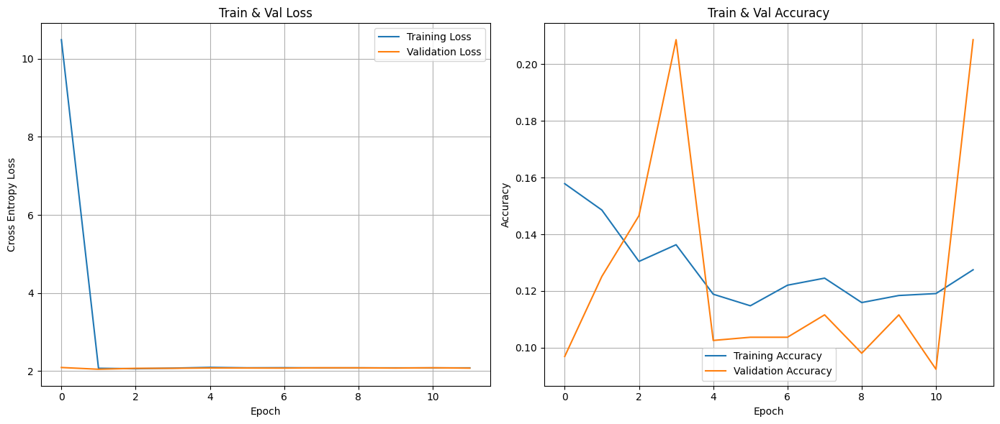

28/28 [==============================] - 0s 6ms/step - loss: 2.0473 - accuracy: 0.1251


Nodes: 64, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 32


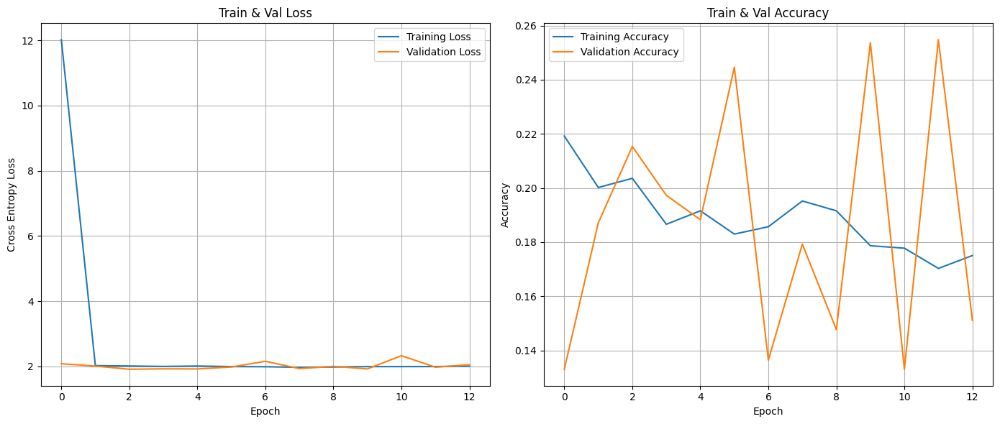

28/28 [==============================] - 0s 6ms/step - loss: 1.9102 - accuracy: 0.2153


Nodes: 64, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 128


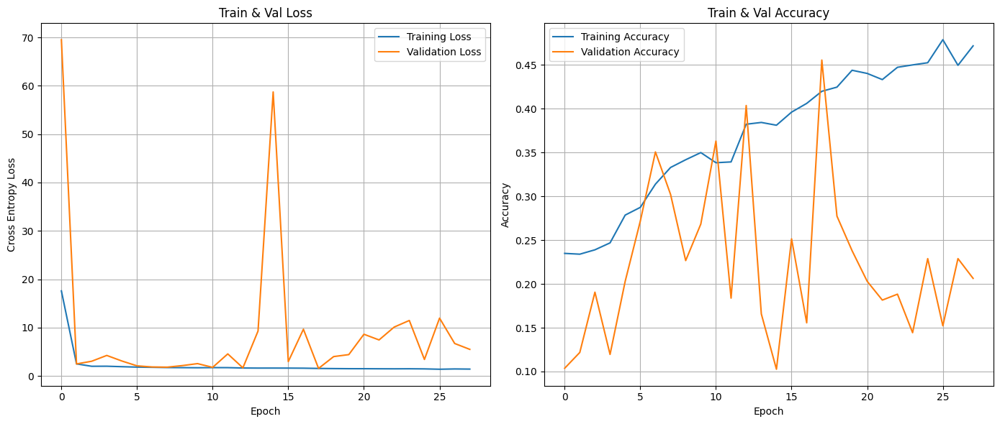

28/28 [==============================] - 0s 6ms/step - loss: 1.5528 - accuracy: 0.4555


Nodes: 64, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 16


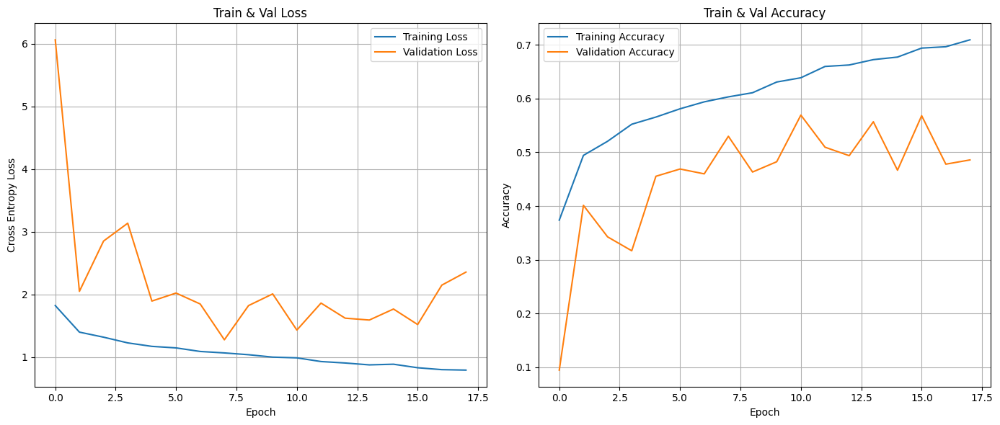

28/28 [==============================] - 0s 6ms/step - loss: 1.2775 - accuracy: 0.5299


Nodes: 64, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 32


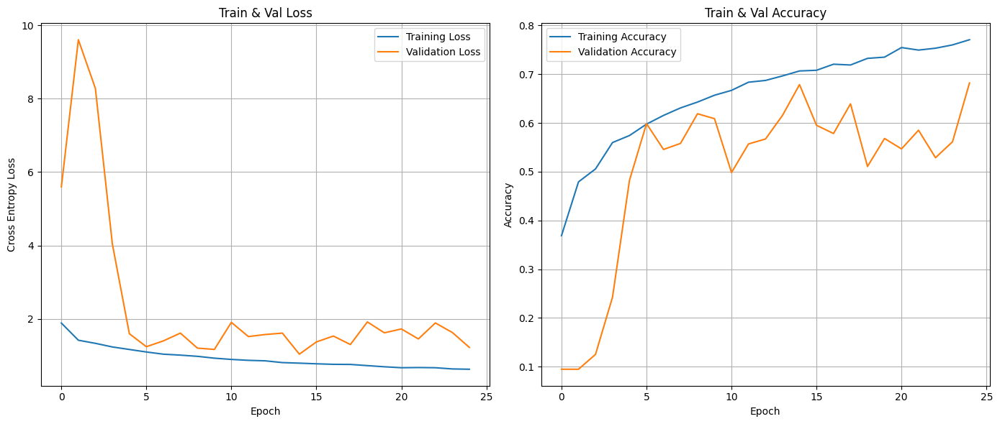

28/28 [==============================] - 0s 6ms/step - loss: 1.0421 - accuracy: 0.6787


Nodes: 64, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 128


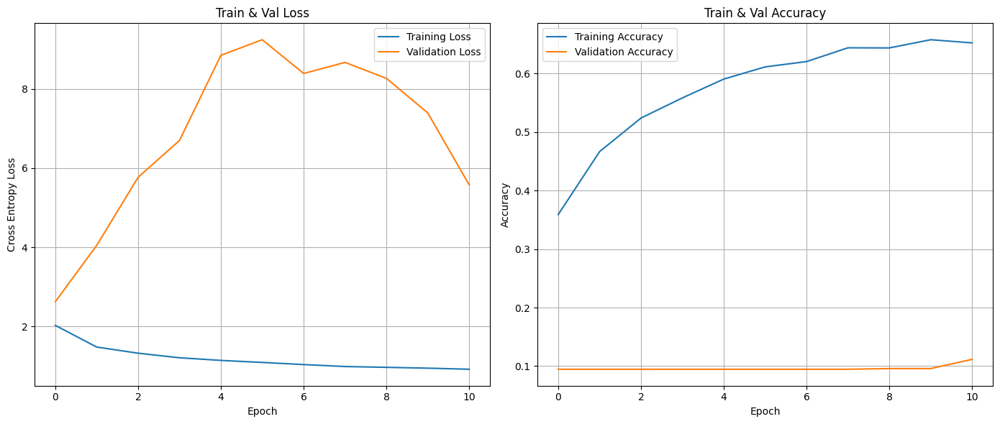

28/28 [==============================] - 0s 6ms/step - loss: 2.6267 - accuracy: 0.0947


Nodes: 64, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 16


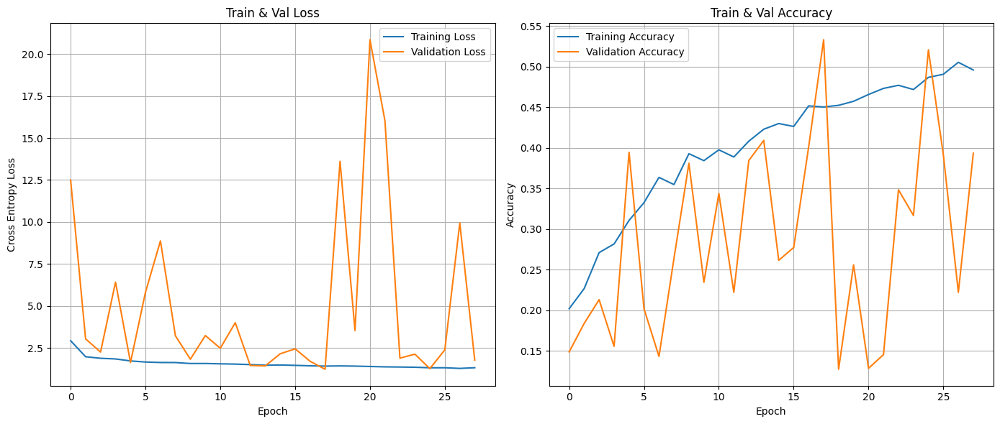

28/28 [==============================] - 0s 6ms/step - loss: 1.2247 - accuracy: 0.5333


Nodes: 64, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 32


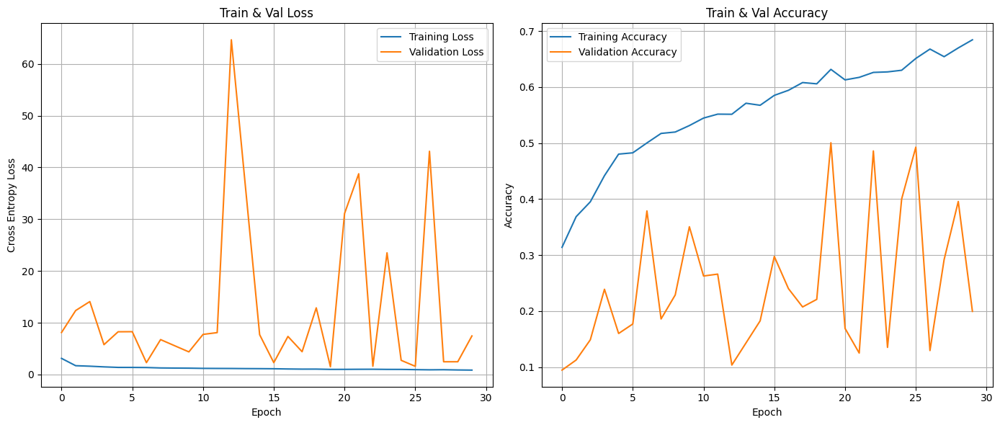

28/28 [==============================] - 0s 6ms/step - loss: 1.5114 - accuracy: 0.5006


Nodes: 64, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 128


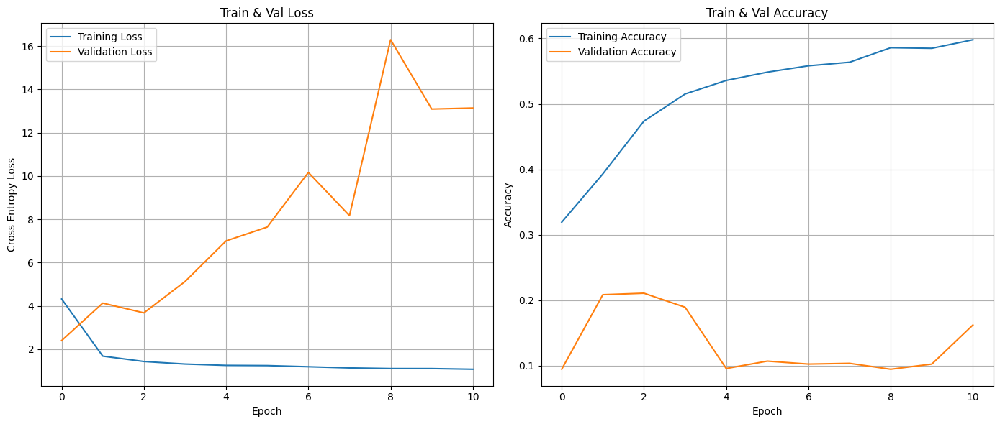

28/28 [==============================] - 0s 6ms/step - loss: 2.4010 - accuracy: 0.0947


Nodes: 64, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 16


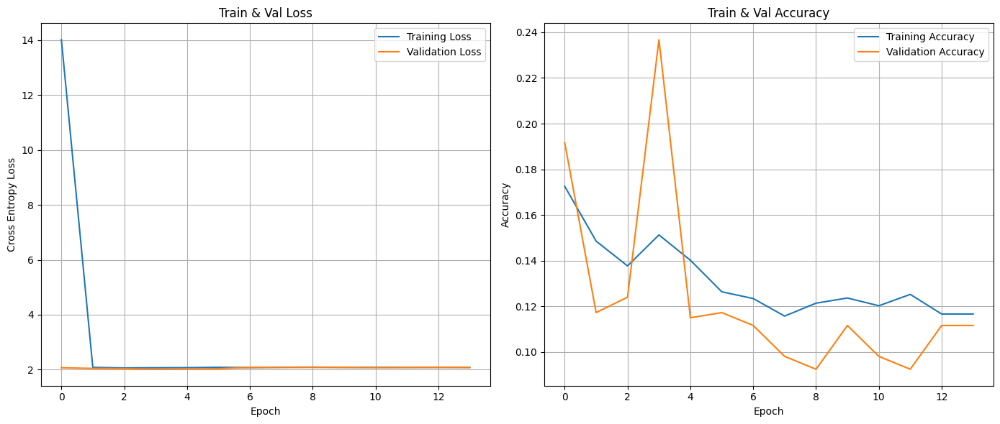

28/28 [==============================] - 0s 6ms/step - loss: 2.0151 - accuracy: 0.2368


Nodes: 64, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 32


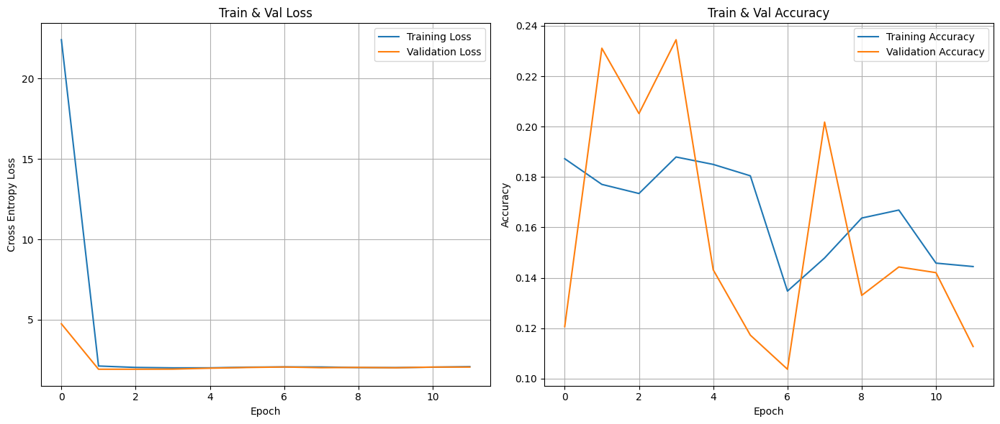

28/28 [==============================] - 0s 6ms/step - loss: 1.9193 - accuracy: 0.2311


Nodes: 64, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 128


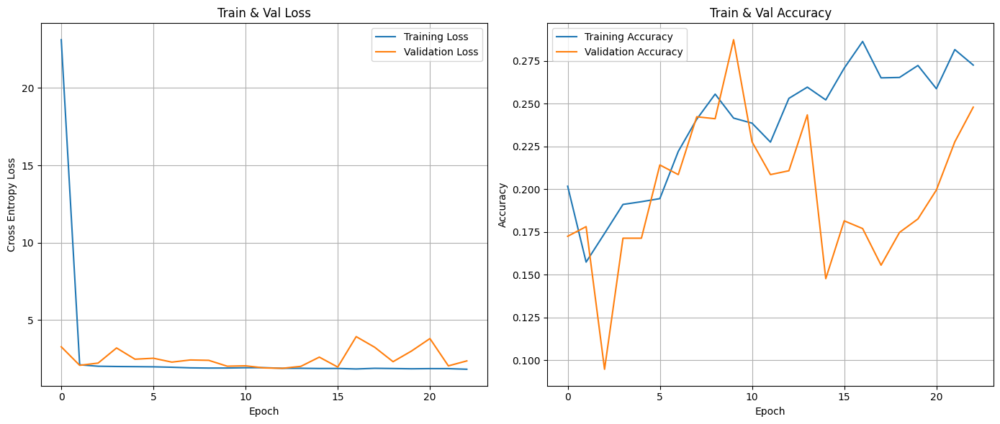

28/28 [==============================] - 0s 6ms/step - loss: 1.8823 - accuracy: 0.2108


Nodes: 128, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 16


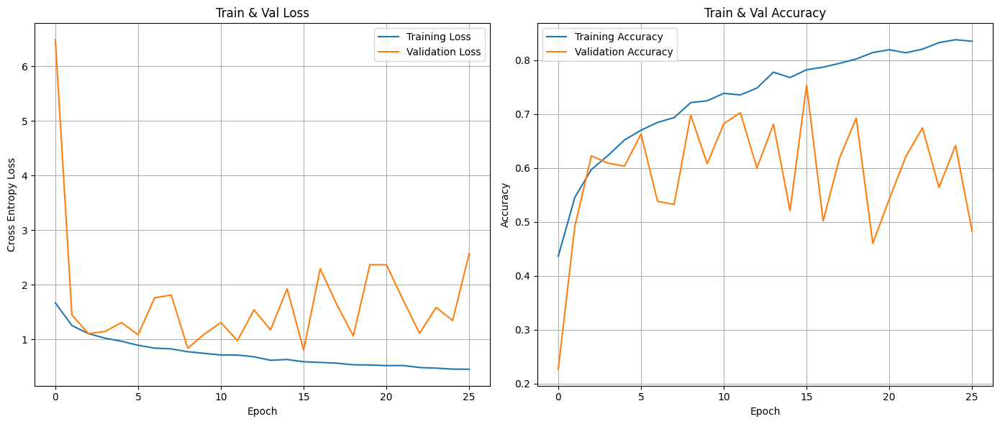

28/28 [==============================] - 0s 6ms/step - loss: 0.8076 - accuracy: 0.7531


Nodes: 128, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 32


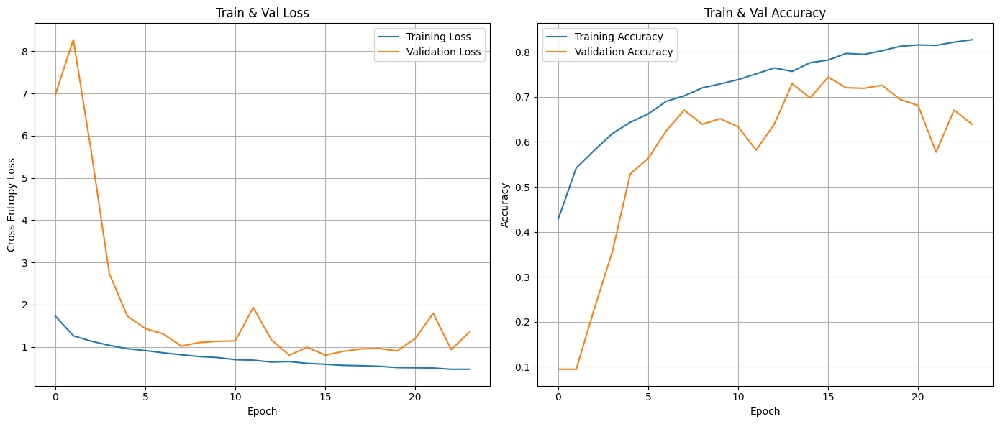

28/28 [==============================] - 0s 6ms/step - loss: 0.8058 - accuracy: 0.7294


Nodes: 128, Dropout: 0.2, Learning Rate: 0.0001, Batch Size: 128


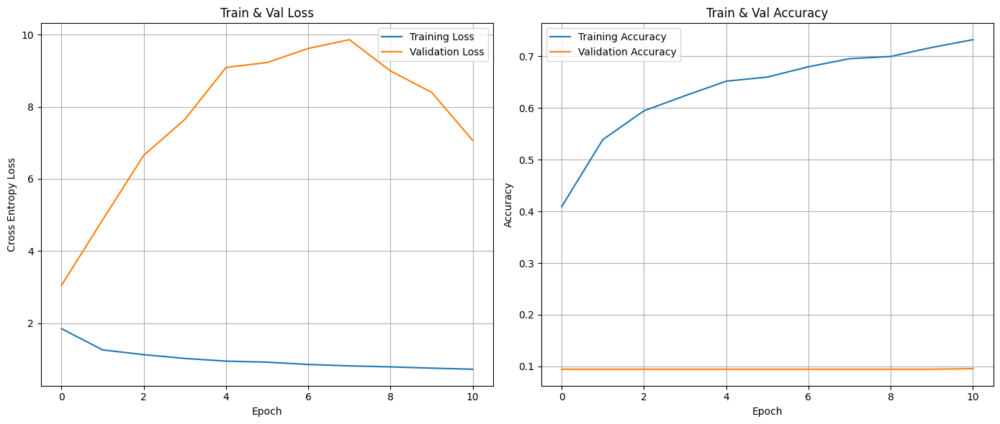

28/28 [==============================] - 0s 6ms/step - loss: 3.0536 - accuracy: 0.0947


Nodes: 128, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 16


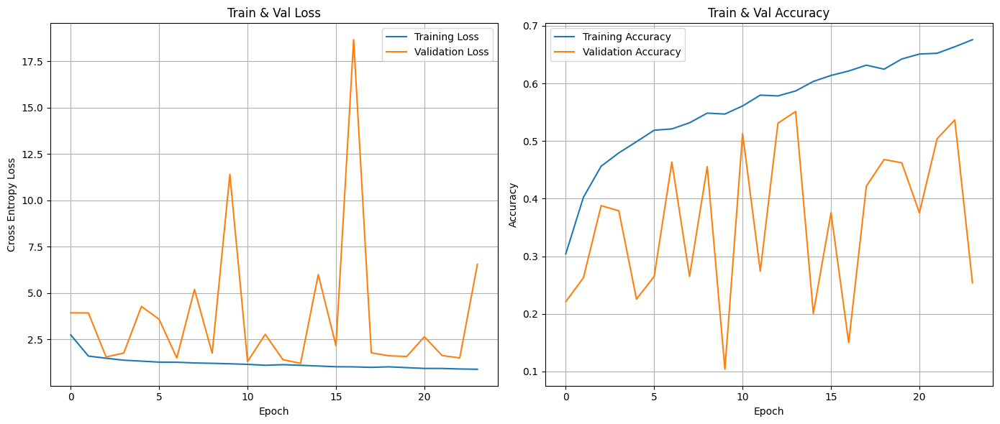

28/28 [==============================] - 0s 6ms/step - loss: 1.2148 - accuracy: 0.5513


Nodes: 128, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 32


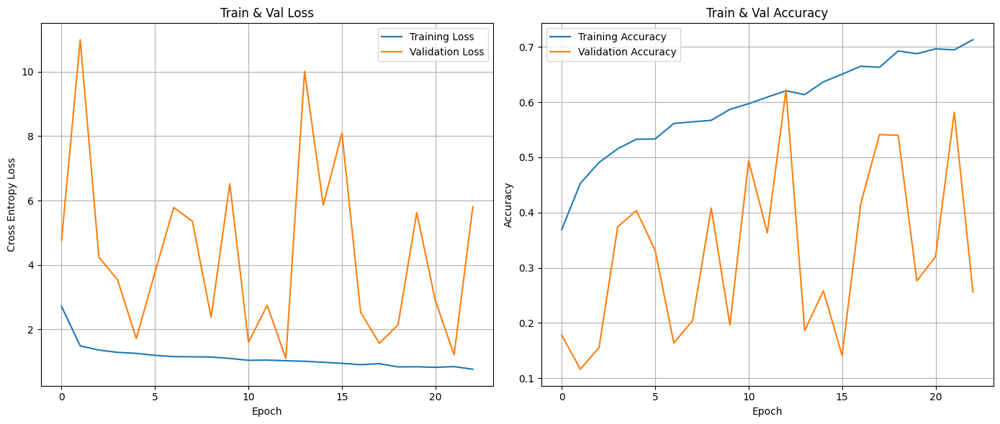

28/28 [==============================] - 0s 6ms/step - loss: 1.0954 - accuracy: 0.6223


Nodes: 128, Dropout: 0.2, Learning Rate: 0.001, Batch Size: 128


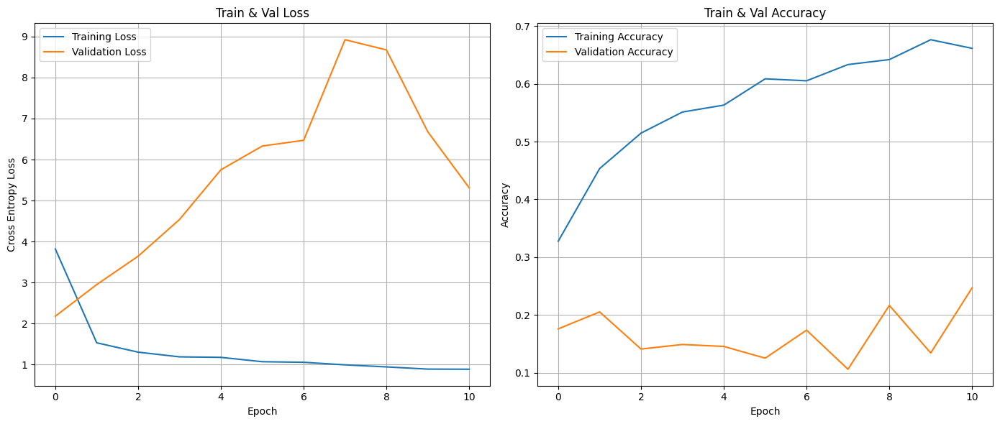

28/28 [==============================] - 0s 6ms/step - loss: 2.1782 - accuracy: 0.1759


Nodes: 128, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 16


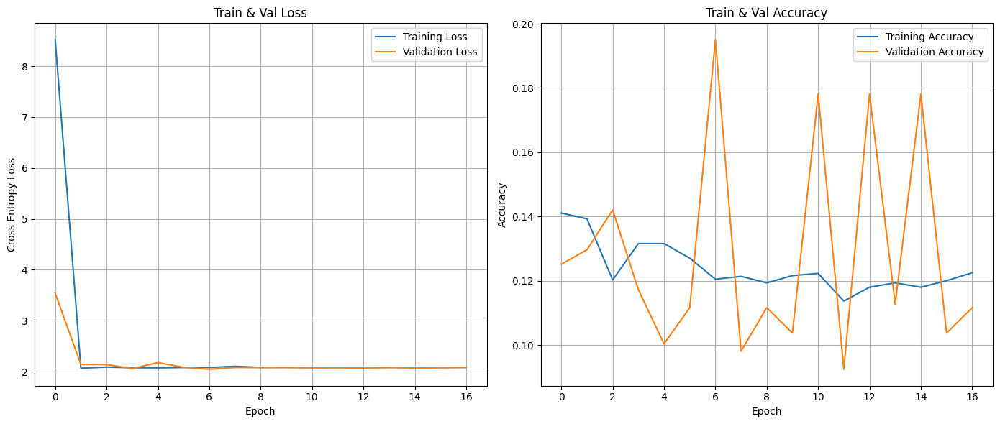

28/28 [==============================] - 0s 6ms/step - loss: 2.0460 - accuracy: 0.1950


Nodes: 128, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 32


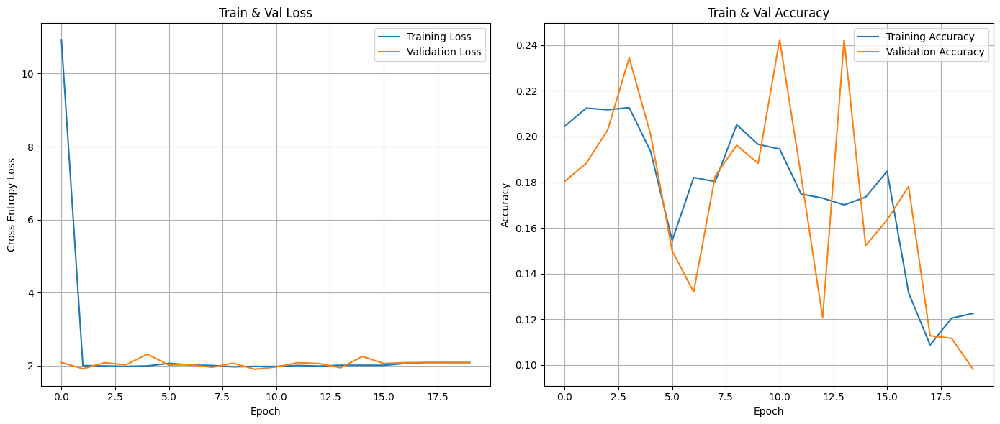

28/28 [==============================] - 0s 6ms/step - loss: 1.8991 - accuracy: 0.1883


Nodes: 128, Dropout: 0.2, Learning Rate: 0.01, Batch Size: 128


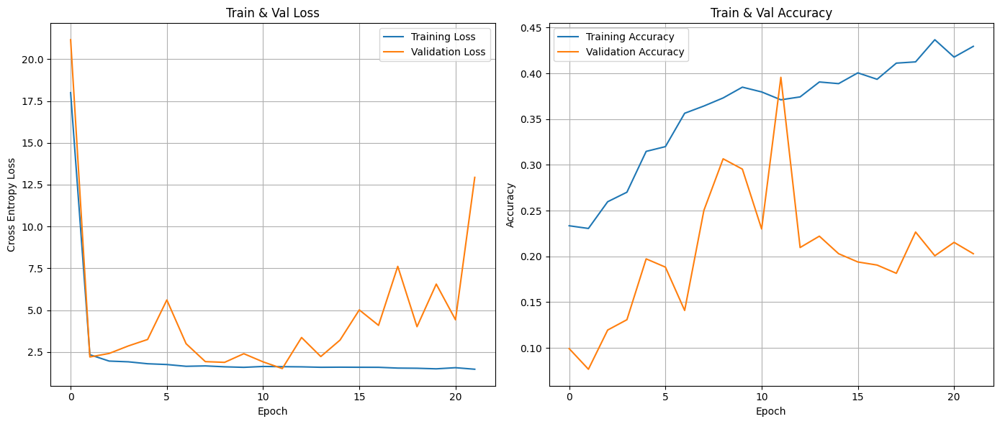

28/28 [==============================] - 0s 6ms/step - loss: 1.5108 - accuracy: 0.3957


Nodes: 128, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 16


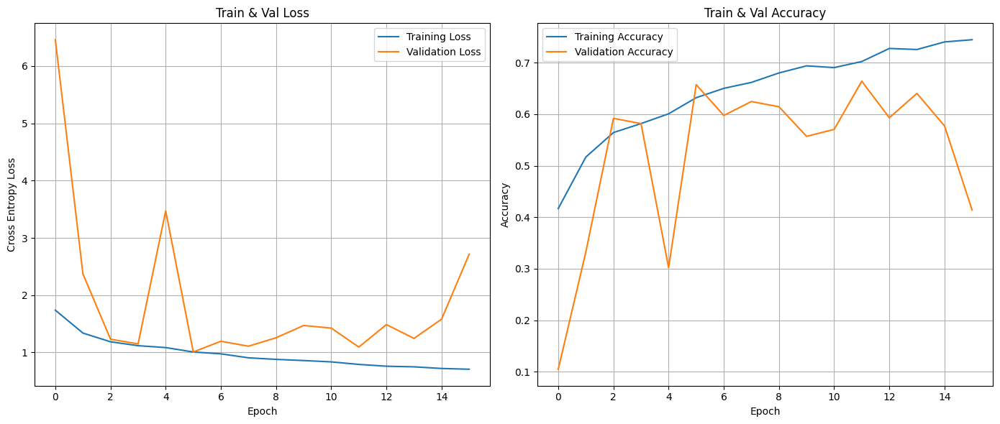

28/28 [==============================] - 0s 6ms/step - loss: 1.0085 - accuracy: 0.6573


Nodes: 128, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 32


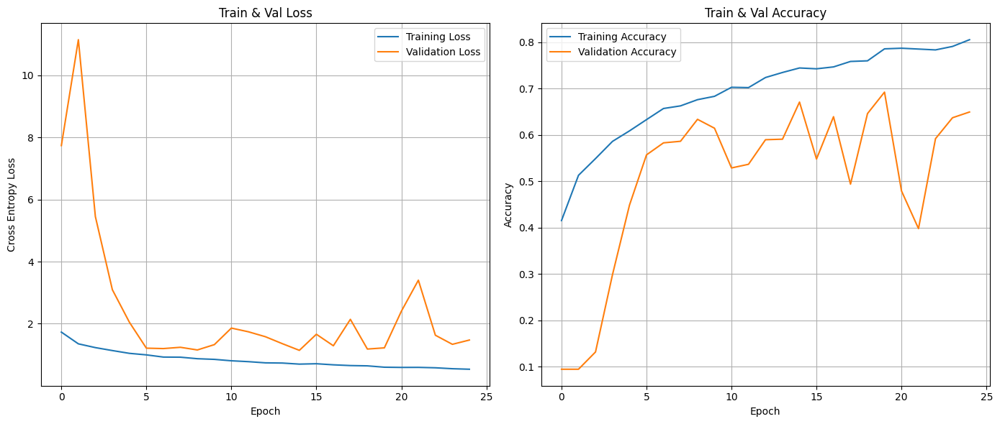

28/28 [==============================] - 0s 6ms/step - loss: 1.1435 - accuracy: 0.6708


Nodes: 128, Dropout: 0.3, Learning Rate: 0.0001, Batch Size: 128


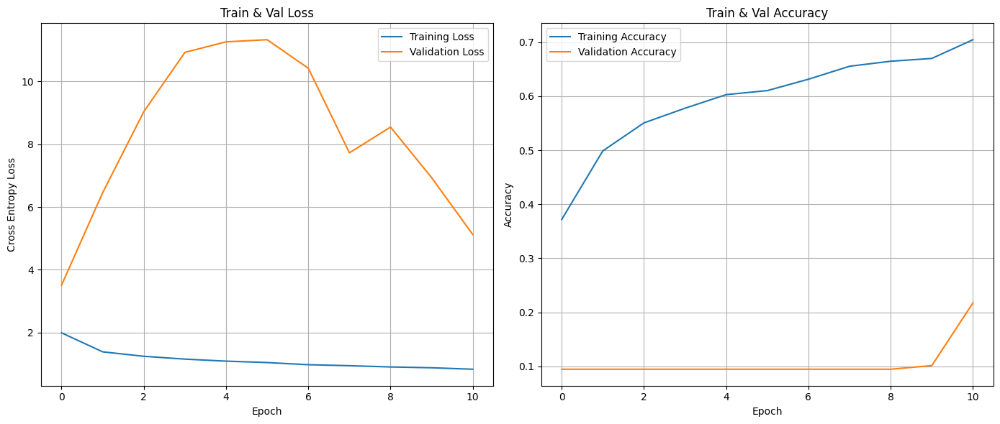

28/28 [==============================] - 0s 6ms/step - loss: 3.5125 - accuracy: 0.0947


Nodes: 128, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 16


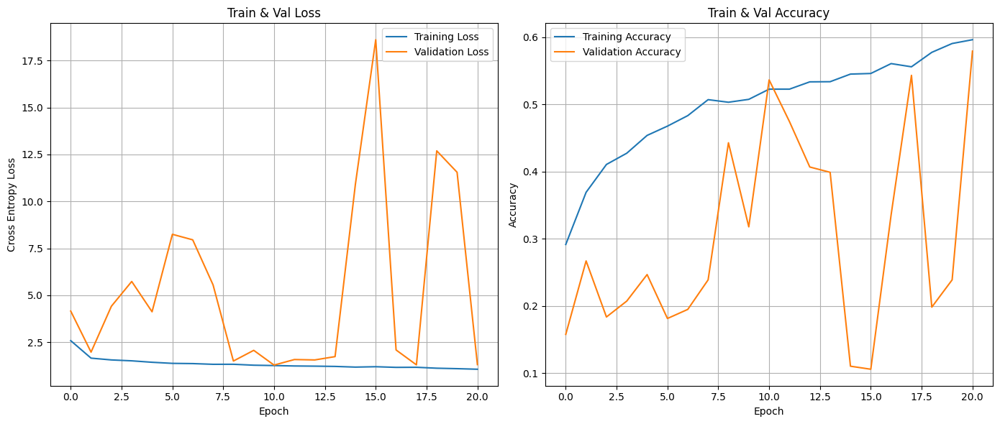

28/28 [==============================] - 0s 6ms/step - loss: 1.2888 - accuracy: 0.5366


Nodes: 128, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 32


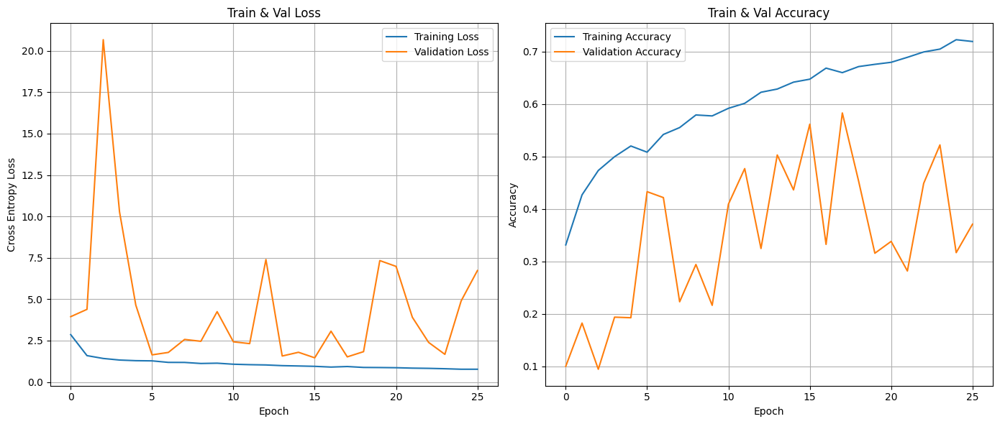

28/28 [==============================] - 0s 6ms/step - loss: 1.4619 - accuracy: 0.5614


Nodes: 128, Dropout: 0.3, Learning Rate: 0.001, Batch Size: 128


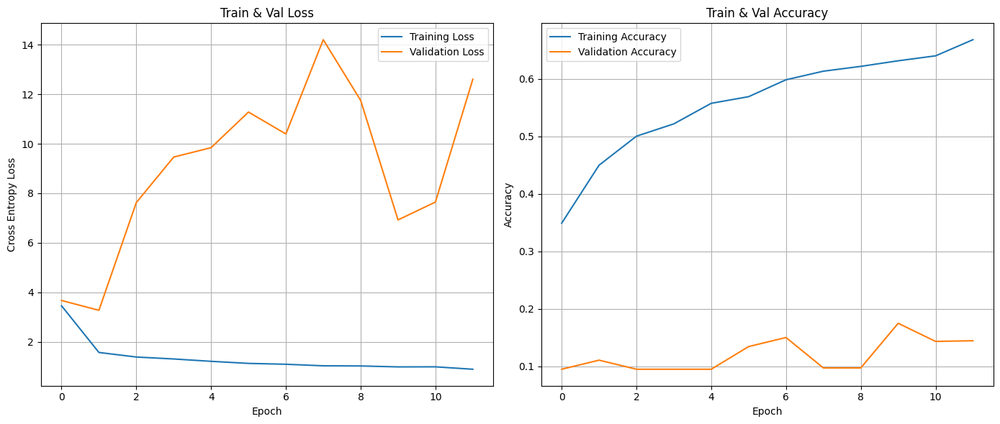

28/28 [==============================] - 0s 6ms/step - loss: 3.2708 - accuracy: 0.1105


Nodes: 128, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 16


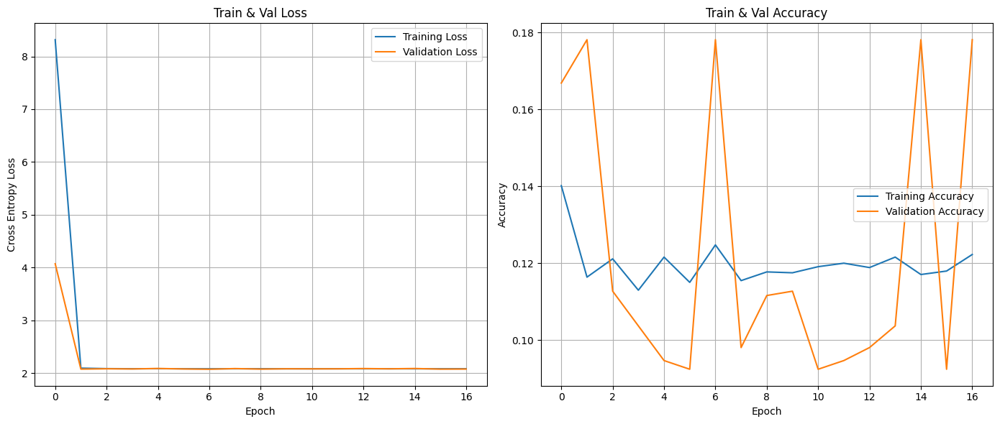

28/28 [==============================] - 0s 6ms/step - loss: 2.0726 - accuracy: 0.1781


Nodes: 128, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 32


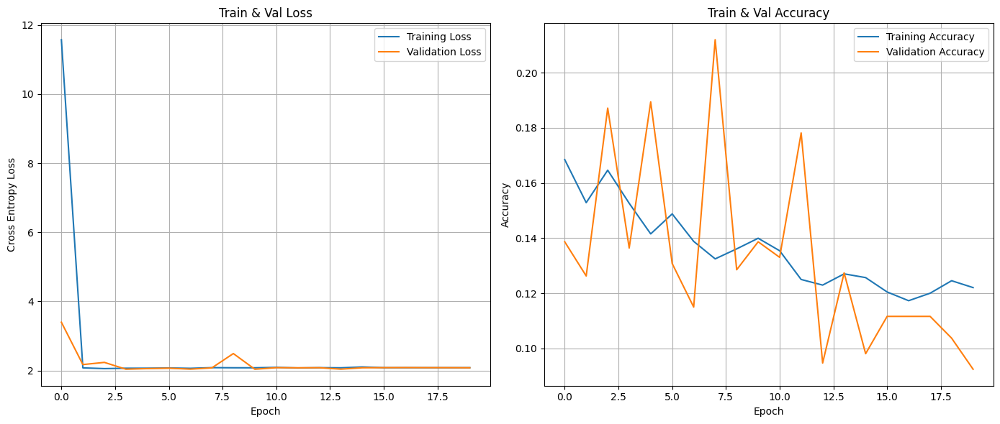

28/28 [==============================] - 0s 6ms/step - loss: 2.0362 - accuracy: 0.1387


Nodes: 128, Dropout: 0.3, Learning Rate: 0.01, Batch Size: 128


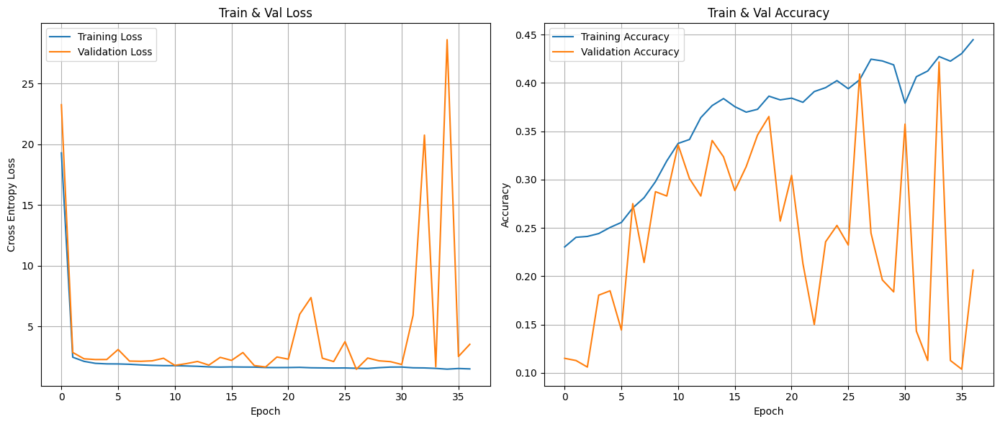

28/28 [==============================] - 0s 6ms/step - loss: 1.4695 - accuracy: 0.4092


Nodes: 128, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 16


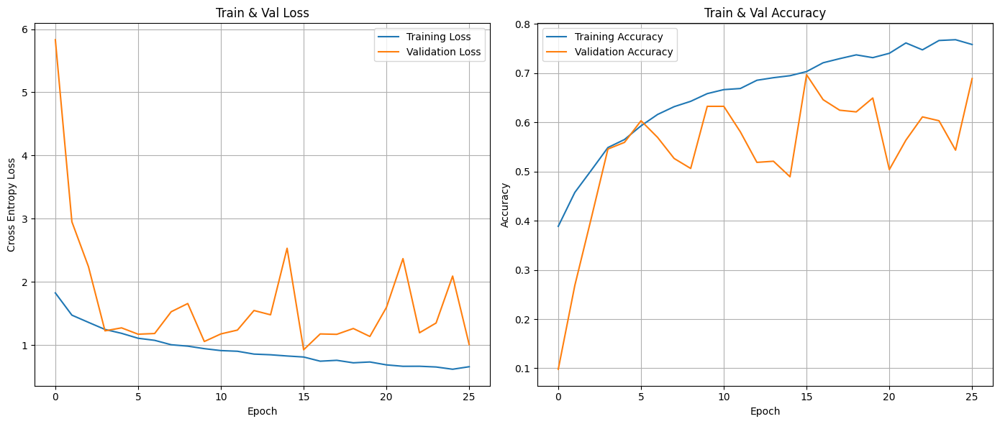

28/28 [==============================] - 0s 6ms/step - loss: 0.9239 - accuracy: 0.6967


Nodes: 128, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 32


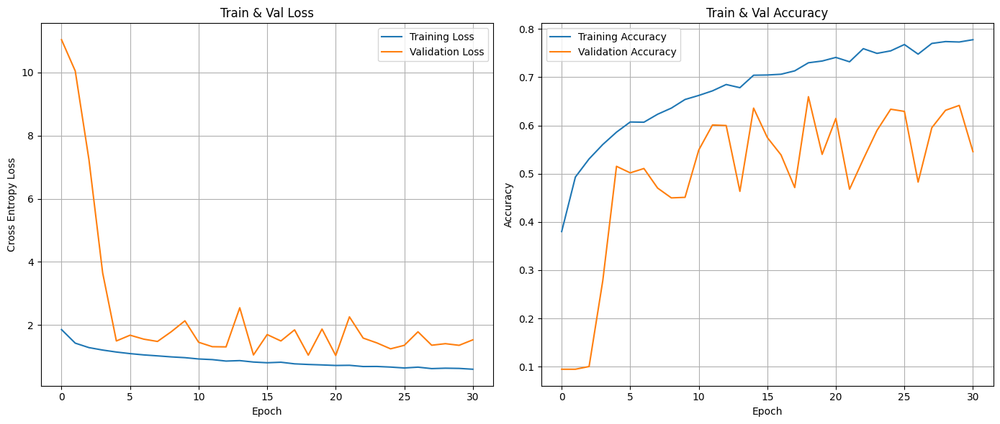

28/28 [==============================] - 0s 6ms/step - loss: 1.0308 - accuracy: 0.6144


Nodes: 128, Dropout: 0.4, Learning Rate: 0.0001, Batch Size: 128


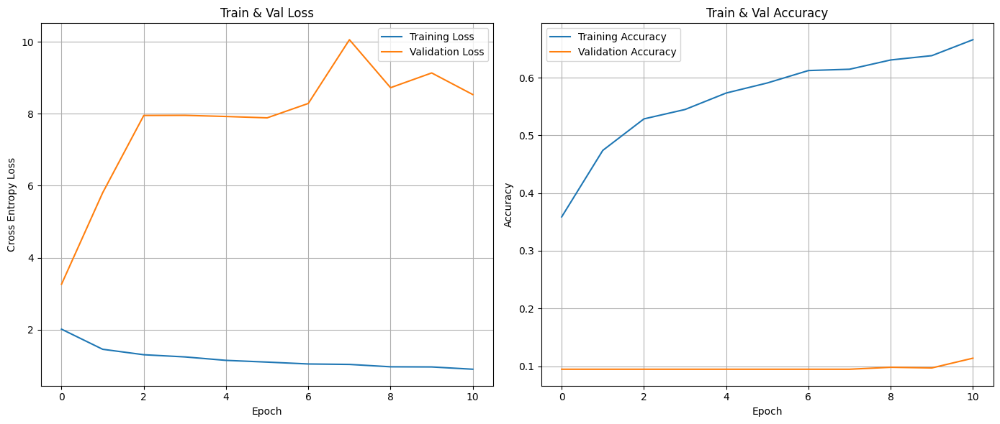

28/28 [==============================] - 0s 6ms/step - loss: 3.2647 - accuracy: 0.0947


Nodes: 128, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 16


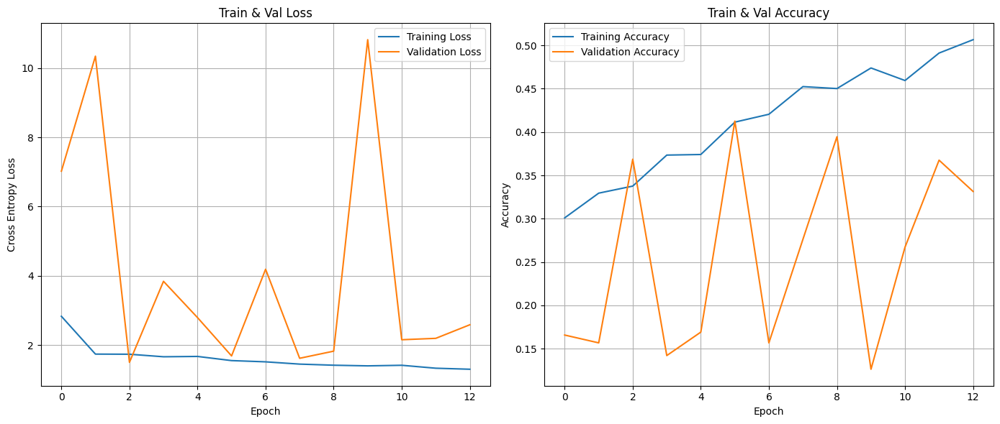

28/28 [==============================] - 0s 6ms/step - loss: 1.5002 - accuracy: 0.3687


Nodes: 128, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 32


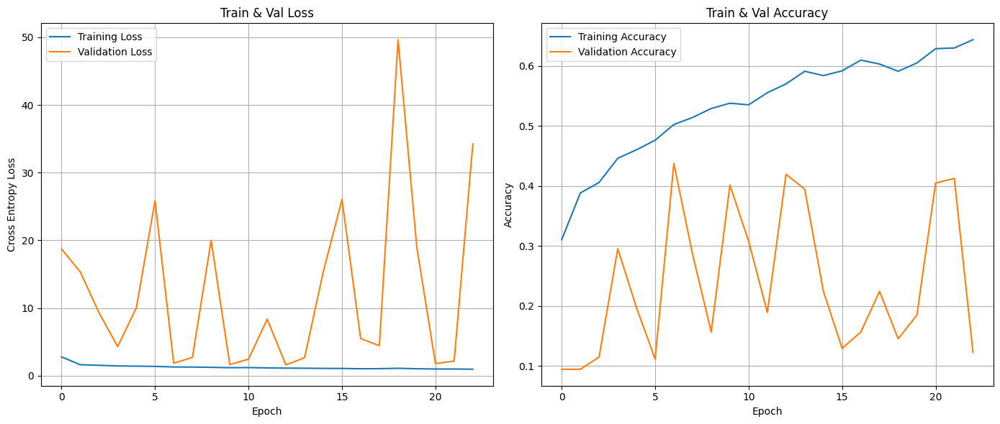

28/28 [==============================] - 0s 6ms/step - loss: 1.6065 - accuracy: 0.4194


Nodes: 128, Dropout: 0.4, Learning Rate: 0.001, Batch Size: 128


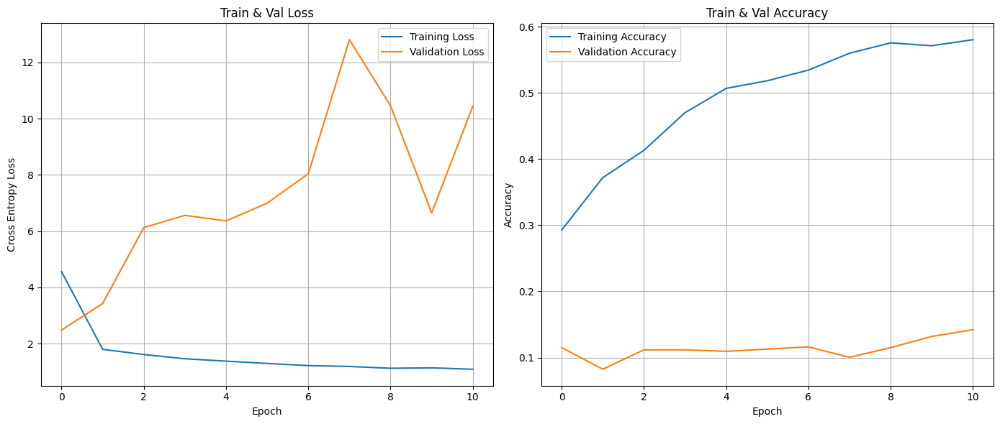

28/28 [==============================] - 0s 6ms/step - loss: 2.4784 - accuracy: 0.1150


Nodes: 128, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 16


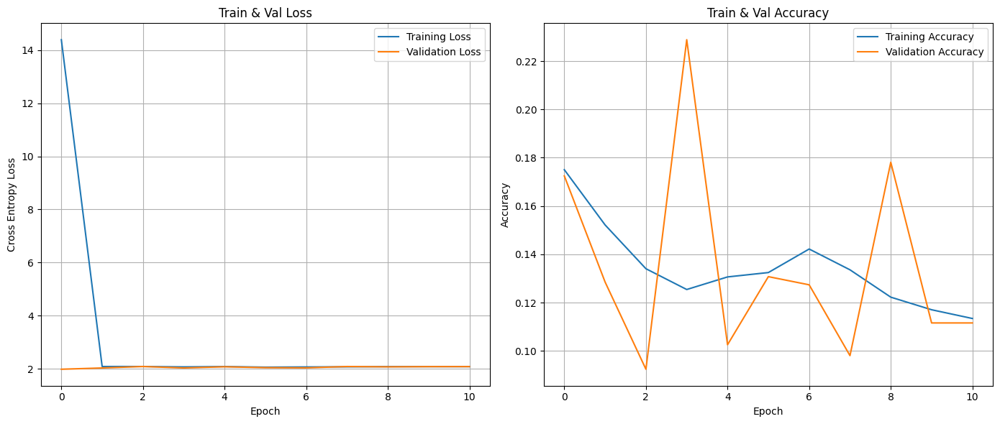

28/28 [==============================] - 0s 6ms/step - loss: 1.9839 - accuracy: 0.1725


Nodes: 128, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 32


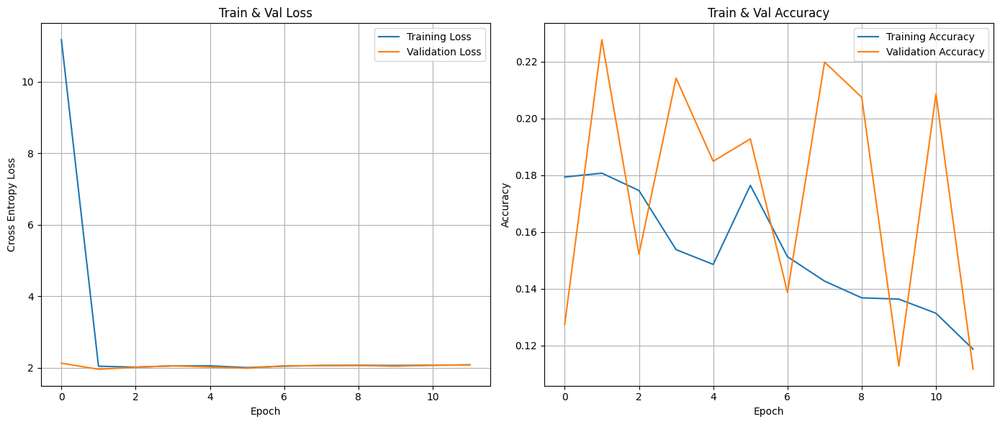

28/28 [==============================] - 0s 6ms/step - loss: 1.9619 - accuracy: 0.2277


Nodes: 128, Dropout: 0.4, Learning Rate: 0.01, Batch Size: 128


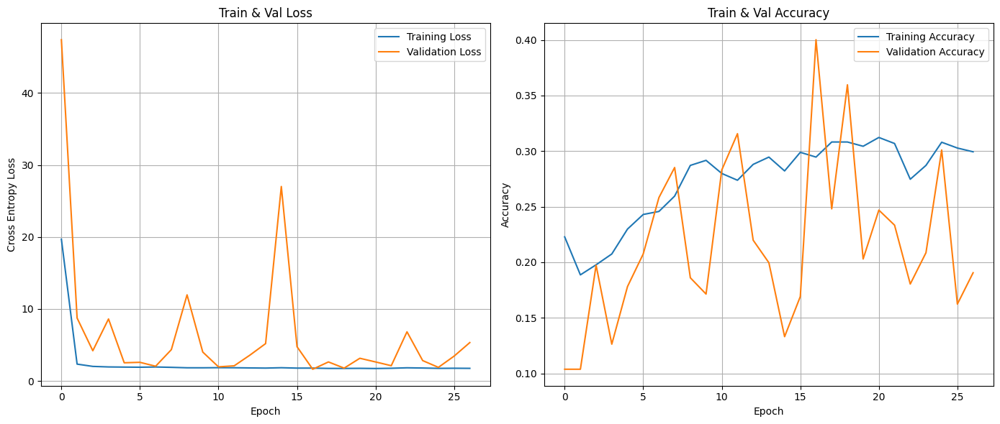

28/28 [==============================] - 0s 6ms/step - loss: 1.6203 - accuracy: 0.4002
Best validation loss: 0.7764
Test accuracy: 0.7441


In [16]:
# Run the test
best_model, best_history, best_test_loss, best_test_accuracy = find_best_model(X_train, y_train, X_valid, y_valid, X_test, y_test, epochs=100)

# Results

### Best History Graph

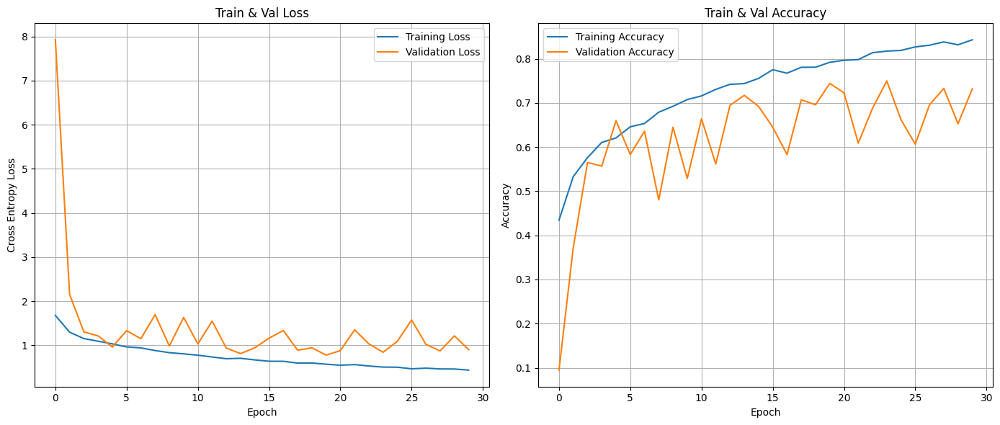

In [17]:
# Plot the best history
plot_history(best_history)

### Accuracy with Test Set

In [18]:
# Evaluate the best model with the test data
test_loss, test_accuracy = best_model.evaluate(X_test, y_test, verbose=0)
print(f'Test accuracy: {test_accuracy:.4f}')

Test accuracy: 0.7441


### Predictions of Test Set

In [19]:
# Predict the classes for the test set
y_pred_prob = best_model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

28/28 [==============================] - 0s 5ms/step


### Classification Report

In [20]:
# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=[class_names[i] for i in range(len(class_names))]))

Classification Report:
              precision    recall  f1-score   support

   Cardboard       0.80      0.77      0.79        93
Food Organic       0.77      0.82      0.79        82
       Glass       0.76      0.88      0.82        84
       Metal       0.65      0.83      0.73       158
       Misc.       0.67      0.43      0.53        99
       Paper       0.81      0.83      0.82       100
     Plastic       0.75      0.62      0.68       184
  Vegetation       0.82      0.86      0.84        87

    accuracy                           0.74       887
   macro avg       0.75      0.76      0.75       887
weighted avg       0.75      0.74      0.74       887



### Confusion Matrix

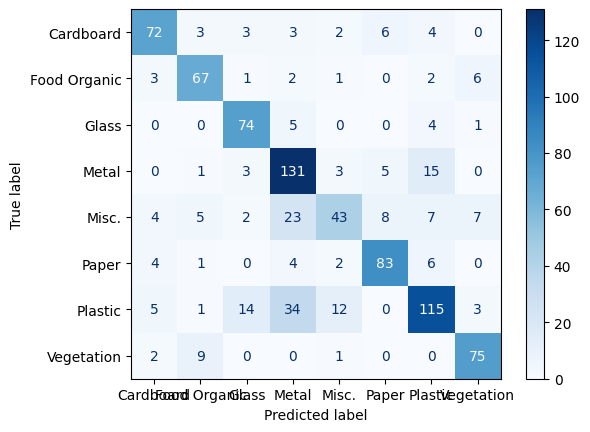

In [21]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=[class_names[i] for i in range(len(class_names))])
disp.plot(cmap=plt.cm.Blues)
plt.show()

### Prediction Visualization

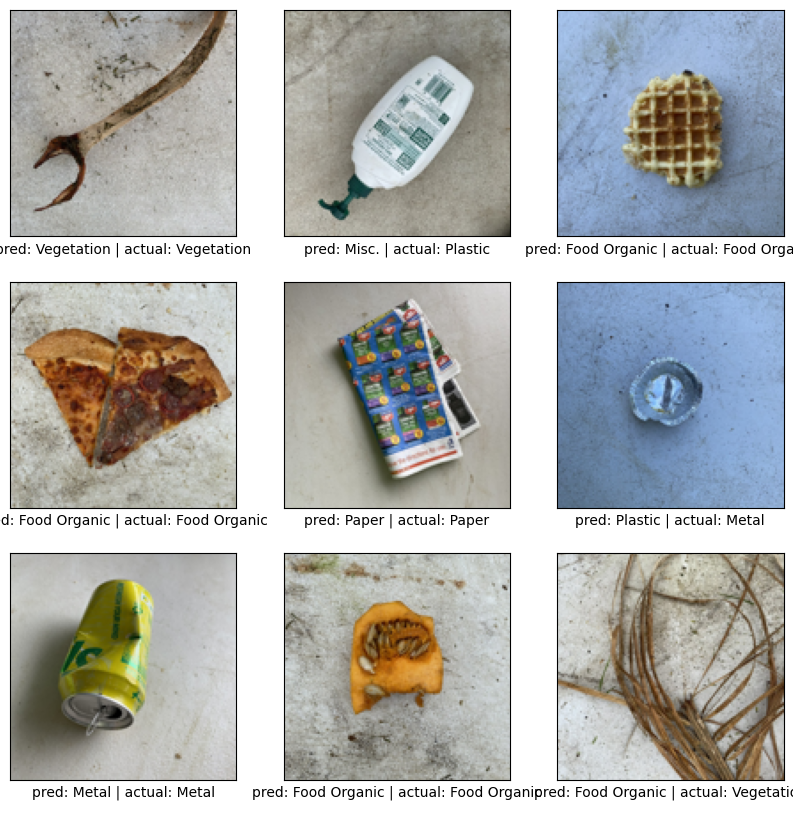

In [22]:
# Select a random set of 9 test images
idx = np.random.randint(len(X_test) - 9)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(X_test[idx + i])
    plt.xlabel("pred: {} | actual: {}\n".format(
        class_names[np.argmax(y_pred_prob[idx + i])],
        class_names[y_test[idx + i]]
    ))
    plt.xticks([])
    plt.yticks([])
plt.show()